In [1]:
import pandas as pd
import numpy as np
import zstandard as zstd
import os
import random
import xlsxwriter

import networkx as nx
from networkx.algorithms import community, bipartite
import igraph as ig

import powerlaw
import matplotlib.pyplot as plt
import seaborn
import scipy

## Load and prepare data

In [2]:
contracts = pd.read_csv('../data/raw/contracts.csv')
aggregated_country_year = pd.read_csv('../data/raw/aggregated_country_year.csv')

In [3]:
print(len(contracts))
print(len(aggregated_country_year))

4098711
234


In [4]:
contracts = contracts.drop(['Unnamed: 0'], axis=1)
contracts.head(3)

,tender_id,year,date_dispatched,issuer_id_final,issuer_name,issuer_canonical_name,issuer_country,issuer_address,issuer_postcode,issuer_town,...,contract_nuts,processed_nuts,contract_cpv,cpv2,contract_eu_funded,contract_type,procedure,n_bids,nocft,single_bidder
0,2.150556e+09,2008,2008-12-11,248_LV_i,"Rēzeknes pilsētas Izglītības pārvalde, LV90000...",rezeknes pilsetas izglitibas parvalde lv900000...,LV,Atbrīvošanas aleja 91,4600,Rēzekne,...,LV005,LV00,74200000.0,74,0.0,1. Services,open,4.0,0,0.0
1,2.152665e+09,2012,2012-12-20,295_UK_i,Chelsea & Westminster Hospital NHS Foundation ...,chelsea westminster hospital nhs foundation tr...,UK,369 Fulham Road,SW10 9NH,London,...,NaN,UK,33111800.0,33,0.0,2. Supplies,restricted,4.0,1,0.0
2,2.224763e+09,2008,2008-01-02,4555_PL_i,Zarząd Dróg i Zieleni w Gdańsku,zarzad drog i zieleni w gdansku_i,PL,ul. Partyzantów 36,80-254,Gdańsk,...,NaN,PL,45233141.0,45,0.0,3. Works,open,1.0,0,1.0


In [5]:
aggregated_country_year = aggregated_country_year.drop(['Unnamed: 0'], axis=1)
aggregated_country_year.head(3)

,country,year,ncontracts,sb_rate,nwinners,nissuers,nedges,non_core_sb_rate,core_ncontracts,core_sb_rate,...,core_density,core_to_non_sb,core_contract_share,eqi_score,ti_cpi,wbgi_cce,vdem_corr,sb_rate_08_16,sb_clustering_vs_random,sb_core_vs_random
0,AT,2008,3192,0.094337,1815,456,2324,0.121861,718,0.101374,...,0.011840,1.074591,0.224937,NaN,81.0,1.843035,0.139032,0.121968,2.088365,0.902565
1,AT,2009,3148,0.100352,1906,429,2482,0.074037,500,0.118953,...,0.012833,1.185354,0.158831,NaN,79.0,1.703025,0.139032,0.121968,3.600993,0.945130
2,AT,2010,3178,0.105601,1762,386,2339,0.149497,647,0.091780,...,0.011105,0.869121,0.203587,1.06285,79.0,1.585462,0.139032,0.121968,1.888154,0.796586


In [6]:
contracts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4098711 entries, 0 to 4098710
Data columns (total 31 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   tender_id              float64
 1   year                   int64  
 2   date_dispatched        object 
 3   issuer_id_final        object 
 4   issuer_name            object 
 5   issuer_canonical_name  object 
 6   issuer_country         object 
 7   issuer_address         object 
 8   issuer_postcode        object 
 9   issuer_town            object 
 10  issuer_type            object 
 11  issuer_sector          object 
 12  winner_id_final        object 
 13  winner_name            object 
 14  winner_canonical_name  object 
 15  winner_country         object 
 16  winner_address         object 
 17  winner_postcode        object 
 18  winner_town            object 
 19  est_value              float64
 20  contract_value         float64
 21  contract_nuts          object 
 22  processed_nuts    

In [7]:
aggregated_country_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234 entries, 0 to 233
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   country                  234 non-null    object 
 1   year                     234 non-null    int64  
 2   ncontracts               234 non-null    int64  
 3   sb_rate                  234 non-null    float64
 4   nwinners                 234 non-null    int64  
 5   nissuers                 234 non-null    int64  
 6   nedges                   234 non-null    int64  
 7   non_core_sb_rate         234 non-null    float64
 8   core_ncontracts          234 non-null    int64  
 9   core_sb_rate             234 non-null    float64
 10  core_nwinners            234 non-null    int64  
 11  core_nissuers            234 non-null    int64  
 12  core_nedges              234 non-null    int64  
 13  core_density             234 non-null    float64
 14  core_to_non_sb           2

In [8]:
# Define a dictionary that maps each country to a color
country_colors_dict = {
    'AT': 'red',
    'BE': 'blue',
    'BG': 'green',
    'CY': 'purple',
    'CZ': 'orange',
    'DE': 'yellow',
    'DK': 'cyan',
    'EE': 'magenta',
    'ES': 'lime',
    'FI': 'teal',
    'FR': 'pink',
    'GR': 'brown',
    'HU': 'gray',
    'IE': 'navy',
    'IT': 'olive',
    'LT': 'maroon',
    'LV': 'gold',
    'NL': 'indigo',
    'NO': 'darkred',
    'PL': 'darkgreen',
    'PT': 'darkorange',
    'RO': 'darkcyan',
    'SE': 'darkmagenta',
    'SI': 'seagreen',
    'SK': 'sienna',
    'UK': 'slateblue'
}

aggregated_country_year['issuer_country'] = aggregated_country_year['country']
aggregated_country_year['winner_country'] = aggregated_country_year['country']

aggregated_country_year['issuer_color'] = aggregated_country_year['issuer_country'].map(country_colors_dict)
aggregated_country_year['winner_color'] = aggregated_country_year['winner_country'].map(country_colors_dict)

In [9]:
# merge contracts and aggregated_country_year country and year
contracts_merged = contracts.merge(aggregated_country_year.drop(['winner_country', 'winner_color'], axis=1), how='left', left_on=['issuer_country', 'year'], right_on=['issuer_country', 'year'])

contracts_merged = contracts_merged.merge(aggregated_country_year[['winner_country', 'winner_color', 'year']], how='left', left_on=['winner_country', 'year'], right_on=['winner_country', 'year'])

In [10]:
contracts_merged.columns

Index(['tender_id', 'year', 'date_dispatched', 'issuer_id_final',
       'issuer_name', 'issuer_canonical_name', 'issuer_country',
       'issuer_address', 'issuer_postcode', 'issuer_town', 'issuer_type',
       'issuer_sector', 'winner_id_final', 'winner_name',
       'winner_canonical_name', 'winner_country', 'winner_address',
       'winner_postcode', 'winner_town', 'est_value', 'contract_value',
       'contract_nuts', 'processed_nuts', 'contract_cpv', 'cpv2',
       'contract_eu_funded', 'contract_type', 'procedure', 'n_bids', 'nocft',
       'single_bidder', 'country', 'ncontracts', 'sb_rate', 'nwinners',
       'nissuers', 'nedges', 'non_core_sb_rate', 'core_ncontracts',
       'core_sb_rate', 'core_nwinners', 'core_nissuers', 'core_nedges',
       'core_density', 'core_to_non_sb', 'core_contract_share', 'eqi_score',
       'ti_cpi', 'wbgi_cce', 'vdem_corr', 'sb_rate_08_16',
       'sb_clustering_vs_random', 'sb_core_vs_random', 'issuer_color',
       'winner_color'],
      dtyp

In [11]:
contracts_merged['tender_id'].nunique()

4098711

In [12]:
# add dummy if single_bidder > 50% (above annual market single bidding rate per country)
contracts_merged['sbr_above_50'] = contracts_merged['single_bidder'].apply(lambda x: 1 if x > 0.5 else 0)

In [13]:
sum(contracts_merged['sbr_above_50']==1)/len(contracts_merged.index)

0.20131719460093672

In [14]:
len(contracts_merged.index)

4098711

In [15]:
contracts_merged['player'] = "issuer"
contracts_merged['player'] = "winner"

In [16]:
# add weights - number of contracts the nodes are involved in
contracts_merged.loc[:, 'count'] = contracts_merged.groupby(['issuer_id_final', 'winner_id_final', 'year', 'issuer_country'])['issuer_id_final'].transform('size')
contracts_merged.loc[:, 'count_awarded'] = contracts_merged.groupby(['issuer_id_final', 'year', 'issuer_country'])['issuer_id_final'].transform('size')
contracts_merged.loc[:, 'count_won'] = contracts_merged.groupby(['winner_id_final', 'year', 'issuer_country'])['winner_id_final'].transform('size')

## Create Graph of full data

In [17]:
G = nx.from_pandas_edgelist(contracts_merged, source='issuer_id_final', target='winner_id_final', edge_key='tender_id',  edge_attr=['year', 'count','ncontracts', 'sb_rate', 'nwinners',
       'nissuers', 'nedges', 'n_bids', 'nocft', 'single_bidder', 'sbr_above_50', 'est_value', 'contract_value'], create_using=nx.MultiGraph)

# set node attributes for issuer
issuer_attrs = ['player', 'issuer_name', 'issuer_canonical_name', 'issuer_country', 'issuer_color', 'issuer_address', 'issuer_postcode', 'issuer_town', 'issuer_type', 'issuer_sector']
issuer_attributes = contracts_merged[issuer_attrs + ['issuer_id_final']].drop_duplicates(subset=['issuer_id_final']).set_index('issuer_id_final').to_dict('index')
nx.set_node_attributes(G, issuer_attributes, 'issuer')

# set node attributes for winner
winner_attrs = ['player', 'winner_name', 'winner_canonical_name', 'winner_country', 'winner_color', 'winner_address', 'winner_postcode', 'winner_town']
winner_attributes = contracts_merged[winner_attrs + ['winner_id_final']].drop_duplicates(subset=['winner_id_final']).set_index('winner_id_final').to_dict('index')
nx.set_node_attributes(G, winner_attributes, 'winner')

In [18]:
# print basic information about the graph
weight = 'count'
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())

degrees = [deg for node, deg in G.degree()]
avg_degree = sum(degrees)/len(G)
print("Average degree: {:.2f}".format(round(avg_degree, 2)))

wt_degrees = [deg for node, deg in G.degree(weight=weight)]
wt_avg_degree = np.nansum(wt_degrees)/len(G)
print("Weighted average degree: {:.2f}".format(round(wt_avg_degree, 2)))

density = nx.density(G)
print("Network density: {:.2f}".format(round(density, 2)))

Number of nodes: 839824
Number of edges: 4098711
Average degree: 9.76
Weighted average degree: 160.69
Network density: 0.00


## Exploratory analysis

### Create example subgraph of 6 countries in 2014 - AT, BG, DE, FI, HU, NL

In [129]:
country = ['AT', 'BG', 'DE', 'FI', 'HU', 'NL']

# create subgraph
for country in country:
    year=2014
    
    contract_country = contracts_merged[(contracts_merged['issuer_country']==country) & (contracts_merged['year']==year)]

    globals()[f"{country}_{year}"] = nx.from_pandas_edgelist(contract_country, source='issuer_id_final', target='winner_id_final', edge_key='tender_id',  edge_attr=['year', 'n_bids', 'nocft', 'single_bidder', 'sbr_above_50', 'est_value', 'contract_value'], create_using=nx.MultiGraph)

    # set node attributes for issuer
    issuer_attrs = ['player', 'issuer_name', 'issuer_canonical_name', 'issuer_country', 'issuer_color', 'issuer_address', 'issuer_postcode', 'issuer_town', 'issuer_type', 'issuer_sector']
    issuer_attributes = contracts_merged[issuer_attrs + ['issuer_id_final']].drop_duplicates(subset=['issuer_id_final']).set_index('issuer_id_final').to_dict('index')
    nx.set_node_attributes(globals()[f"{country}_{year}"], issuer_attributes, 'issuer')

    # set node attributes for winner
    winner_attrs = ['player', 'winner_name', 'winner_canonical_name', 'winner_country', 'winner_color', 'winner_address', 'winner_postcode', 'winner_town']
    winner_attributes = contracts_merged[winner_attrs + ['winner_id_final']].drop_duplicates(subset=['winner_id_final']).set_index('winner_id_final').to_dict('index')

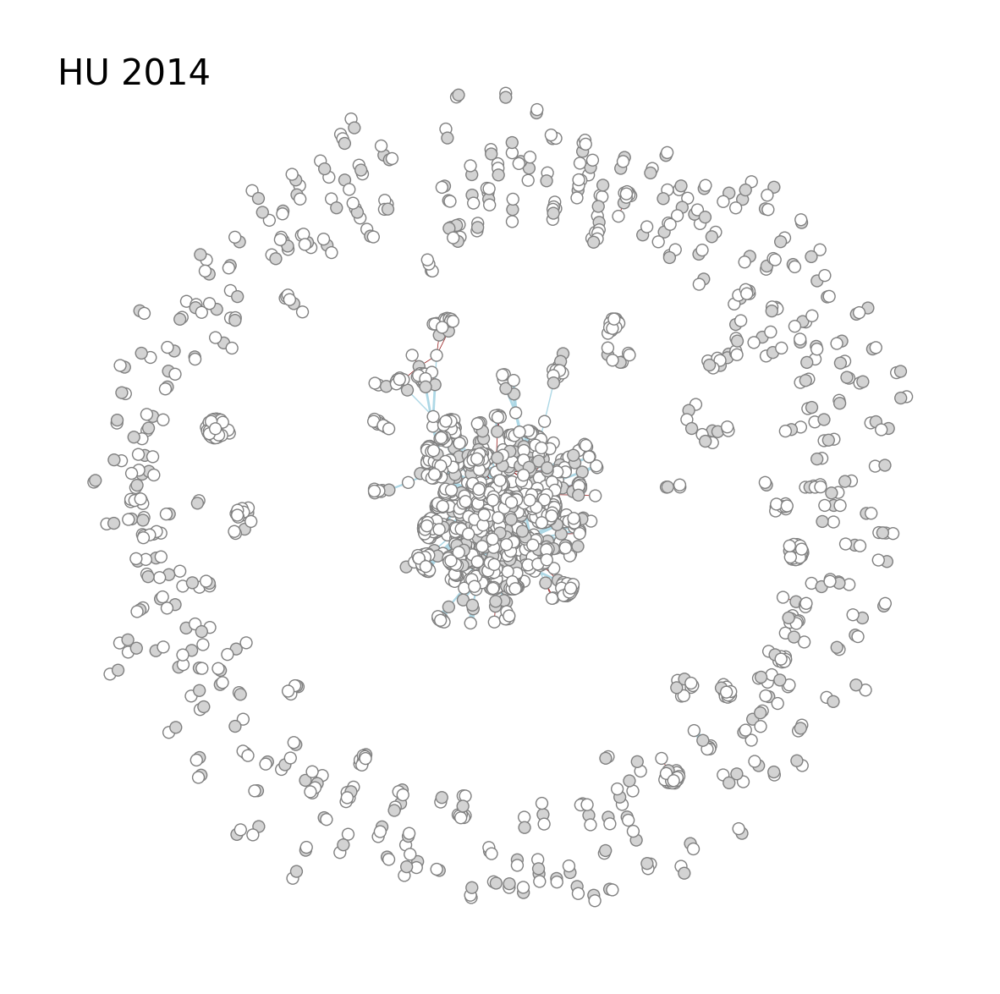

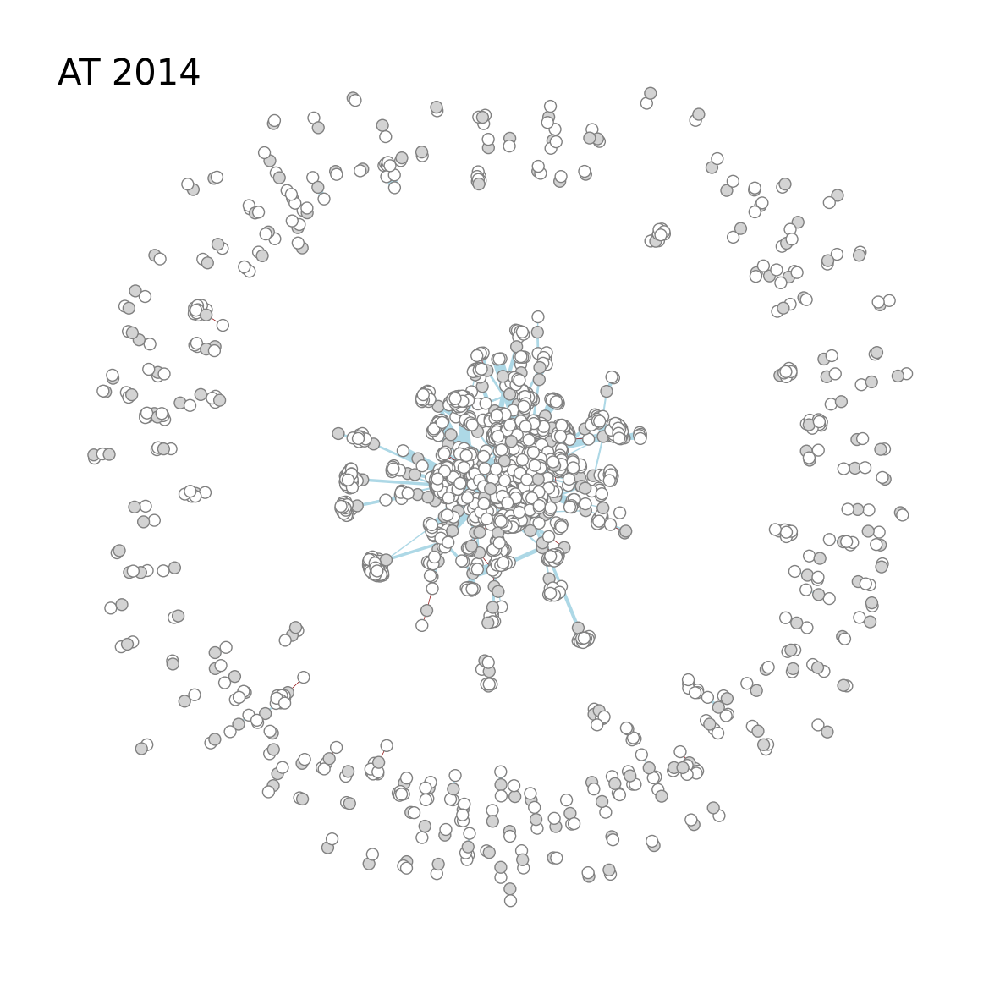

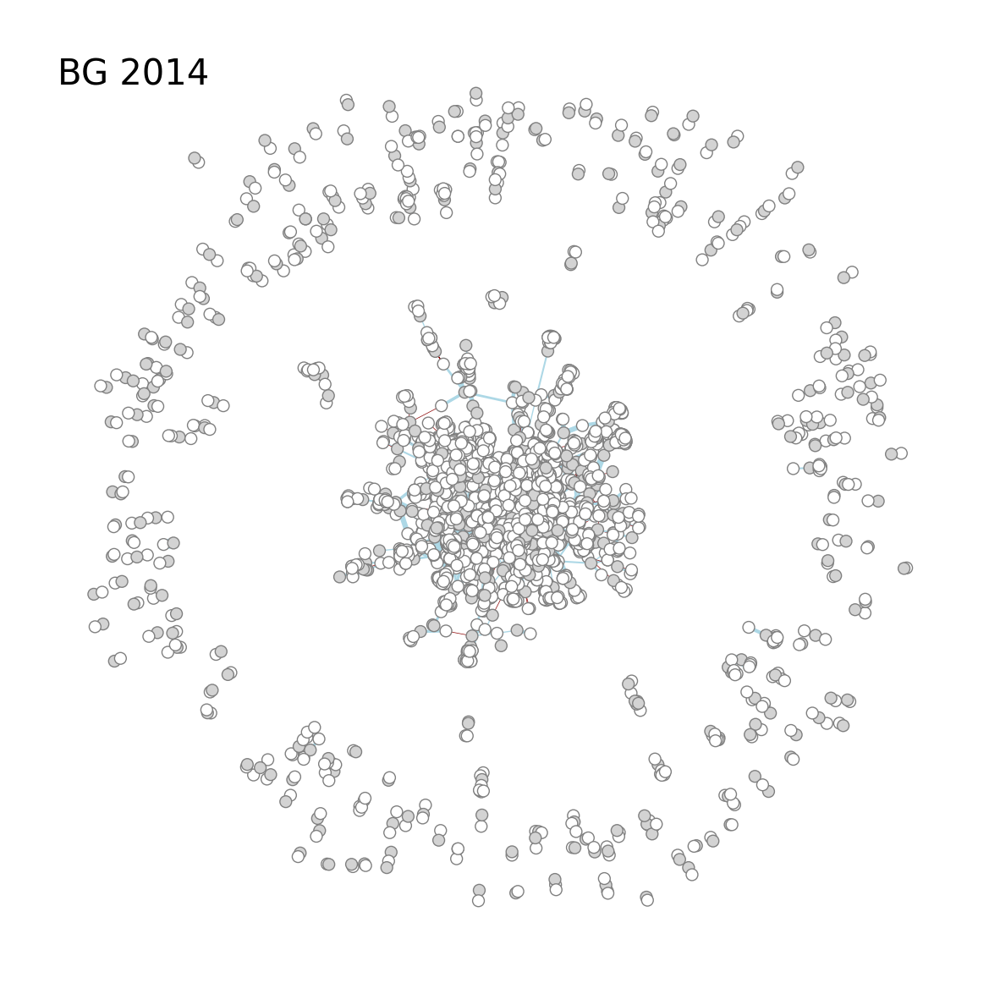

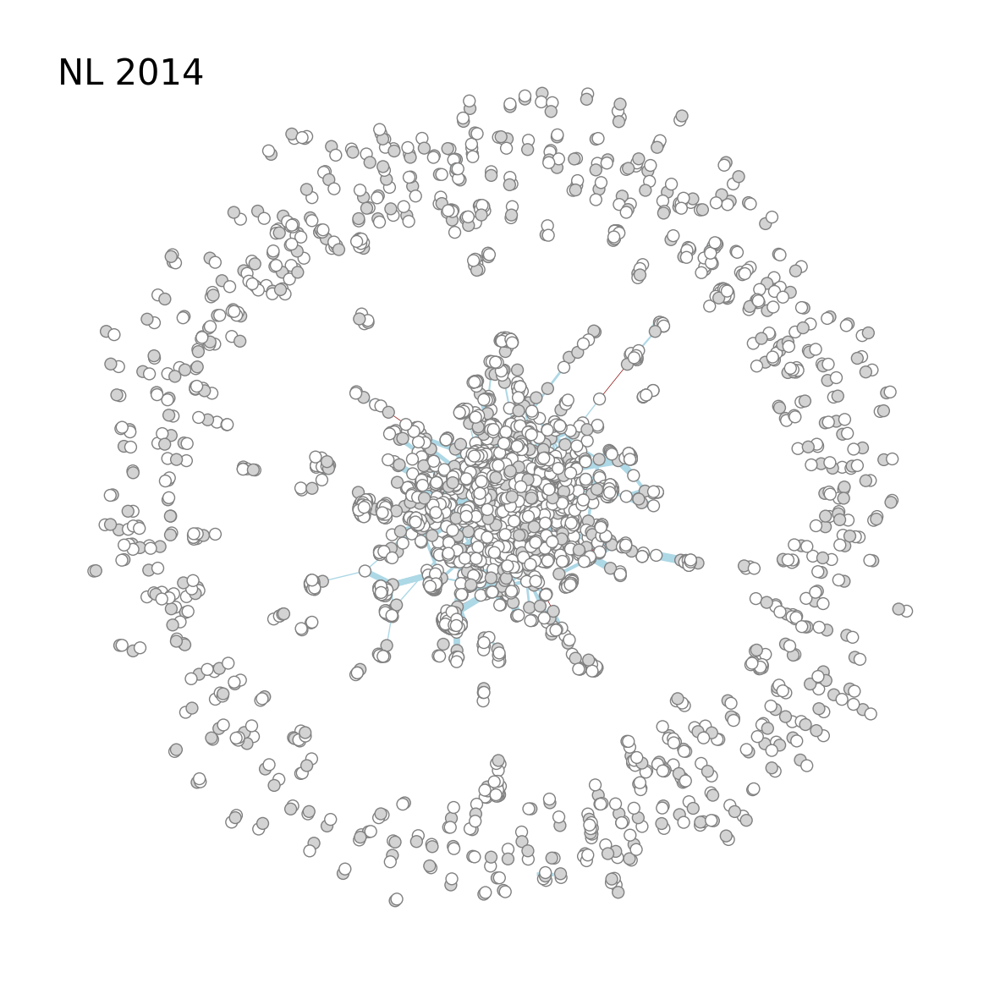

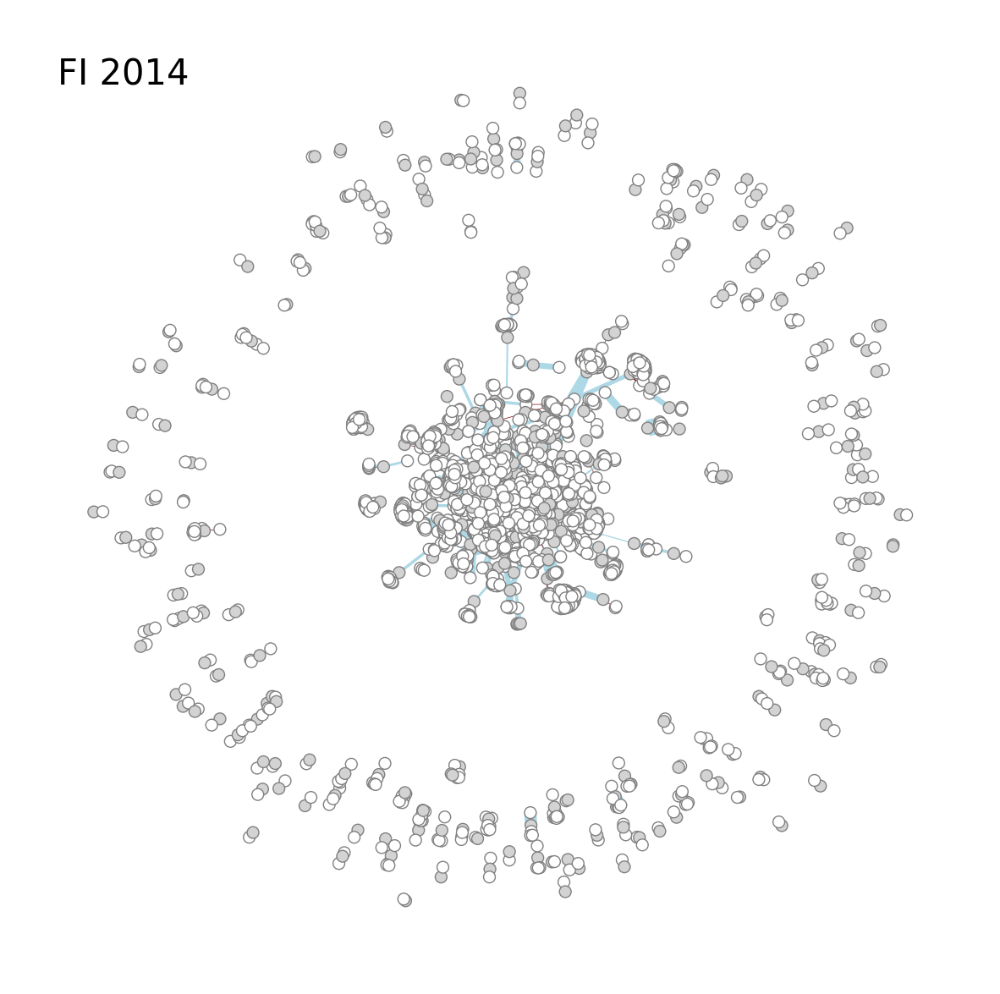

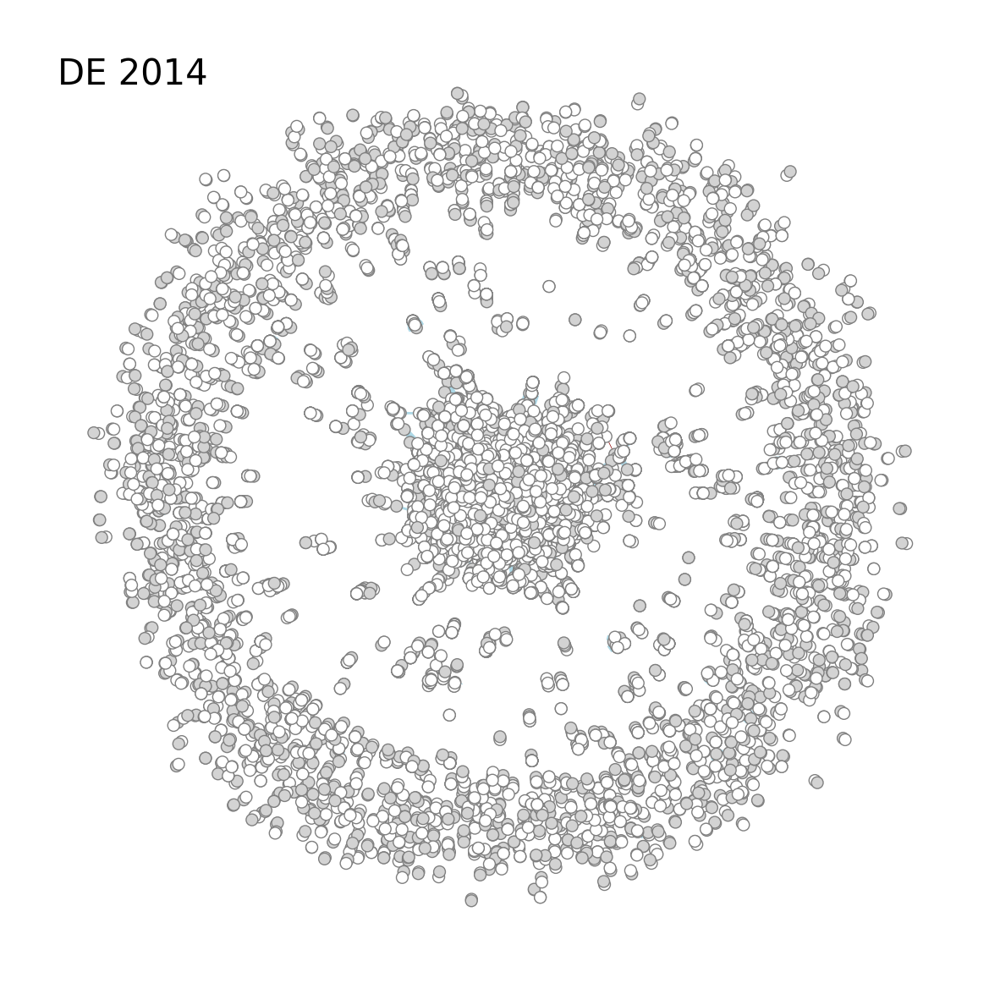

In [49]:
# create plot
country = ['HU', 'AT', 'BG', 'NL', 'FI', 'DE']
for country in country:
  year = 2014

  fig, ax = plt.subplots(figsize=(15,15))

  # Add label to top left corner
  ax.text(0.05, 0.95, f"{country} {year}", fontsize=30, transform=ax.transAxes, ha='left', va='top')

  seed=1
  random.seed(seed)

  # Nodes
  node_size = 100
  node_alpha=0.5
  node_colors = ['lightgray' if node.endswith('i') else 'white' if node.endswith('w') else 'blue' for node in globals()[f"{country}_{year}"].nodes()]

  # Edges
  weight='count'
  edge_alpha=0.7
  weights = nx.get_edge_attributes(globals()[f"{country}_{year}"], weight)
  weights = {edge: weight * 0.5 for edge, weight in weights.items()}
  edge_colors = ['darkred' if globals()[f"{country}_{year}"].get_edge_data(*edge)[list(globals()[f"{country}_{year}"].get_edge_data(*edge).keys())[0]]['sbr_above_50']==1 else 'lightblue' for edge in globals()[f"{country}_{year}"].edges()]

  # Plot the graph
  pos = nx.spring_layout(globals()[f"{country}_{year}"], seed=seed)
  nx.draw(globals()[f"{country}_{year}"], pos, with_labels=False, edgecolors='gray', node_size=node_size, node_color=node_colors, 
                      edge_color=edge_colors, width=list(weights.values()))
  
  plt.savefig('../output/figures/graph_' + str(country) + "_" + str(year) + '.png', bbox_inches='tight')
  plt.show()
  

### Summary statistics of DE subgraphs from 2008 to 2016

In [19]:
contracts_merged_DE = contracts_merged[contracts_merged['issuer_country']=="DE"]

In [20]:
contracts_merged_DE['count'].unique()

array([   1,    4,    2,    5,    3,   17,    6,    7,    8,    9,   20,
         14,   10,   18,   31,   19,   12,   29,   24,   22,   33,   16,
         11,   15,   35,   51,   25,   42,   13,   23,   60,   37,  424,
         21,   28,   62,   74,   53,   30,   68,   92,   36, 1108,   86,
         87,   41,  467,   26,   39,   94,   34,   46,   27,   54,   44,
         43,   32,   38,   58,   52,   63,   45,   50,   40,   66,   49,
         76,   59,   47,   69,   64,   48,   72], dtype=int64)

In [21]:
writer = pd.ExcelWriter('../output/tables/count_DE_contracts.xlsx', engine='xlsxwriter')

for year in range(2008, 2017):
    count_DE = contracts_merged_DE[contracts_merged_DE['year'] == year]['count'].value_counts()
    df_count_DE = pd.DataFrame({'count': count_DE.index, 'frequency': count_DE.values}).sort_values('count')
    print(str(year), np.mean(df_count_DE['count']))

    count_awarded_DE = contracts_merged_DE[contracts_merged_DE['year'] == year]['count_awarded'].value_counts()
    df_count_awarded_DE = pd.DataFrame({'count_awarded': count_awarded_DE.index, 'frequency_awarded': count_awarded_DE.values}).sort_values('count_awarded')

    count_won_DE = contracts_merged_DE[contracts_merged_DE['year'] == year]['count_won'].value_counts()
    df_count_won_DE = pd.DataFrame({'count_won': count_won_DE.index, 'frequency_won': count_won_DE.values}).sort_values('count_won')

    df_count_merged = pd.concat([df_count_DE, df_count_awarded_DE, df_count_won_DE], axis=1)
    df_count_merged.to_excel(writer, sheet_name=str(year), index=True)

writer.close()


2008 16.23076923076923
2009 32.32142857142857
2010 62.791666666666664
2011 15.793103448275861
2012 20.27027027027027
2013 23.953488372093023
2014 27.27659574468085
2015 26.58695652173913
2016 26.444444444444443


Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit


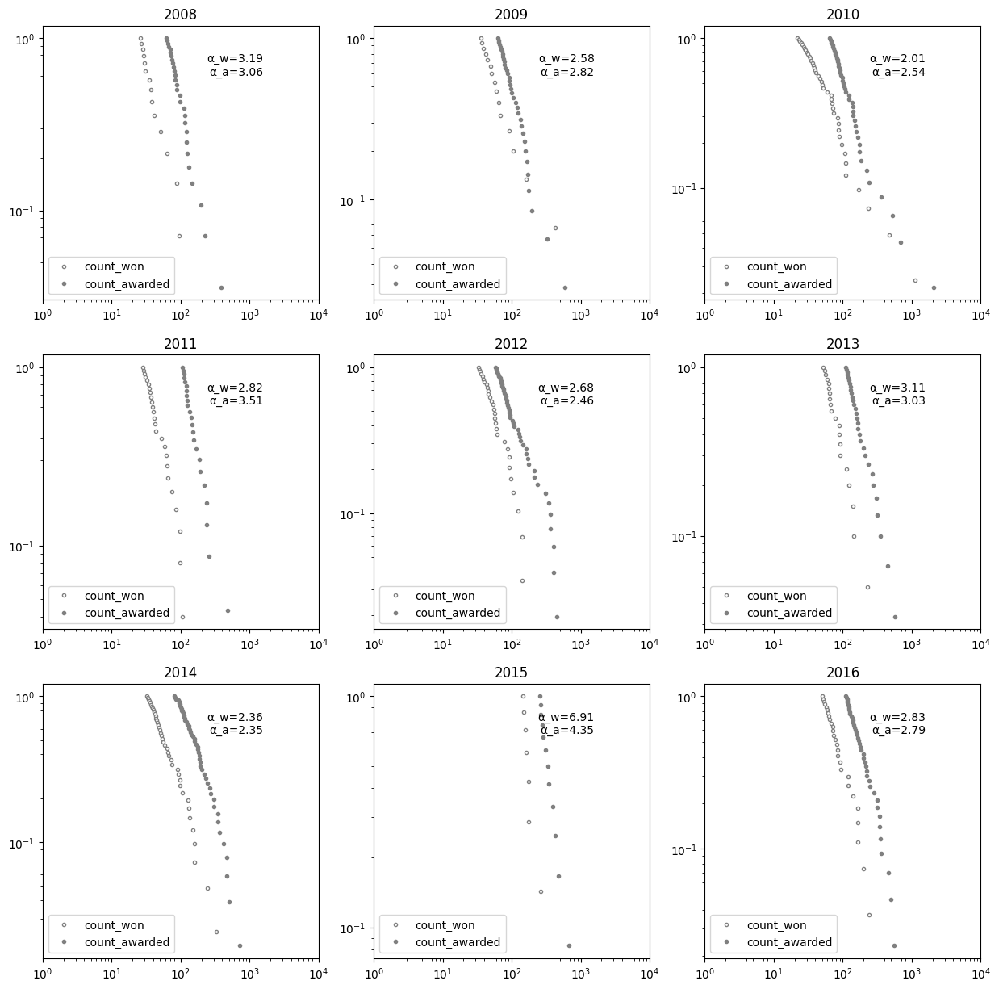

In [22]:
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,15))

# set same x-axis limits and ticks for all subplots
x_min = 1
x_max = 10000
xticks = [1, 10, 100, 1000, 10000]

for i, year in enumerate(range(2008, 2017)):
    count_DE = contracts_merged_DE[contracts_merged_DE['year'] == year]['count'].value_counts()
    df_count_DE = pd.DataFrame({'count': count_DE.index, 'frequency': count_DE.values}).sort_values('count')

    count_awarded_DE = contracts_merged_DE[contracts_merged_DE['year'] == year]['count_awarded'].value_counts()
    df_count_awarded_DE = pd.DataFrame({'count_awarded': count_awarded_DE.index, 'frequency_awarded': count_awarded_DE.values}).sort_values('count_awarded')

    count_won_DE = contracts_merged_DE[contracts_merged_DE['year'] == year]['count_won'].value_counts()
    df_count_won_DE = pd.DataFrame({'count_won': count_won_DE.index, 'frequency_won': count_won_DE.values}).sort_values('count_won')
    
    fit_won = powerlaw.Fit(df_count_won_DE['count_won'], discrete=True)
    fit_awarded = powerlaw.Fit(df_count_awarded_DE['count_awarded'], discrete=True)
    
    fit_won.plot_ccdf(ax=axs[i//3][i%3], color='gray', linestyle='', marker='.', markerfacecolor='white', markeredgecolor='gray', label='count_won')
    fit_awarded.plot_ccdf(ax=axs[i//3][i%3], color='gray', linestyle='', marker='.', markerfacecolor='gray', markeredgecolor='gray', label='count_awarded')
    axs[i//3][i%3].set_title(str(year))
    axs[i//3][i%3].legend(loc='lower left')
    axs[i//3][i%3].text(0.8, 0.9, f'α_w={fit_won.alpha:.2f}\nα_a={fit_awarded.alpha:.2f}', fontsize=10, transform=axs[i//3][i%3].transAxes, ha='right', va='top')
    
    # set x-axis limits and ticks
    axs[i//3][i%3].set_xlim(x_min, x_max)
    axs[i//3][i%3].set_xticks(xticks)

# set main axis labels
# fig.text(0.5, 0.08, 'No. of Contracts', ha='center', fontsize=14)
# fig.text(0.08, 0.5, 'Distribution', va='center', rotation='vertical', fontsize=14)

plt.savefig('../output/figures/DE_power_law_dist' + '.png', bbox_inches='tight')
plt.show()


In [23]:
DE = nx.from_pandas_edgelist(contracts_merged_DE, source='issuer_id_final', target='winner_id_final', edge_key='tender_id',  edge_attr=['year', 'count', 'n_bids', 'nocft', 'single_bidder', 'sbr_above_50', 'est_value', 'contract_value'], create_using=nx.MultiGraph)

# set node attributes for issuer
issuer_attrs = ['player', 'issuer_name', 'issuer_canonical_name', 'issuer_country', 'issuer_color', 'issuer_address', 'issuer_postcode', 'issuer_town', 'issuer_type', 'issuer_sector']
issuer_attributes = contracts_merged[issuer_attrs + ['issuer_id_final']].drop_duplicates(subset=['issuer_id_final']).set_index('issuer_id_final').to_dict('index')
nx.set_node_attributes(DE, issuer_attributes, 'issuer')

# set node attributes for winner
winner_attrs = ['player', 'winner_name', 'winner_canonical_name', 'winner_country', 'winner_color', 'winner_address', 'winner_postcode', 'winner_town']
winner_attributes = contracts_merged[winner_attrs + ['winner_id_final']].drop_duplicates(subset=['winner_id_final']).set_index('winner_id_final').to_dict('index')
nx.set_node_attributes(DE, winner_attributes, 'winner')

In [24]:
# print basic information about the graph
print("Number of nodes:", DE.number_of_nodes())
print("Number of edges:", DE.number_of_edges())

degrees = [deg for node, deg in DE.degree()]
avg_degree = sum(degrees)/len(DE)
print("Average degree: {:.2f}".format(round(avg_degree, 2)))

wt_degrees = [deg for node, deg in G.degree(weight='count')]
wt_avg_degree = np.nansum(wt_degrees)/len(DE)
print("Weighted average degree: {:.2f}".format(round(wt_avg_degree, 2)))

density = nx.density(DE)
print("Network density: {:.2f}".format(round(density, 2)))


Number of nodes: 88997
Number of edges: 291056
Average degree: 6.54
Weighted average degree: 1516.39
Network density: 0.00


In [25]:
# create subgraph
for year in range(2008, 2017):
  country = "DE"

  contracts_merged_DE_year = contracts_merged_DE[(contracts_merged_DE['year']==year)]

  globals()[f"{country}_{year}"] = nx.from_pandas_edgelist(contracts_merged_DE_year, source='issuer_id_final', target='winner_id_final', edge_key='tender_id',  edge_attr=['year', 'count','n_bids', 'nocft', 'single_bidder', 'sbr_above_50', 'est_value', 'contract_value'], create_using=nx.MultiGraph)

  # set node attributes for issuer
  issuer_attrs = ['player', 'issuer_name', 'issuer_canonical_name', 'issuer_country', 'issuer_color', 'issuer_address', 'issuer_postcode', 'issuer_town', 'issuer_type', 'issuer_sector']
  issuer_attributes = contracts_merged_DE[issuer_attrs + ['issuer_id_final']].drop_duplicates(subset=['issuer_id_final']).set_index('issuer_id_final').to_dict('index')
  nx.set_node_attributes(globals()[f"{country}_{year}"], issuer_attributes, 'issuer')

  # set node attributes for winner
  winner_attrs = ['player', 'winner_name', 'winner_canonical_name', 'winner_country', 'winner_color', 'winner_address', 'winner_postcode', 'winner_town']
  winner_attributes = contracts_merged_DE[winner_attrs + ['winner_id_final']].drop_duplicates(subset=['winner_id_final']).set_index('winner_id_final').to_dict('index')
  nx.set_node_attributes(globals()[f"{country}_{year}"], winner_attributes, 'winner')

In [34]:
# plot subgraph DE per year
for year in range(2012, 2017):
    country = "DE"

    fig, ax = plt.subplots(figsize=(15,15))
    
    ax.text(0.05, 0.95, f"{year}", fontsize=30, transform=ax.transAxes, ha='left', va='top')

    seed=1
    random.seed(seed)

    # Nodes
    node_size = 80
    node_alpha=0.5
    node_colors = ['lightgray' if node.endswith('i') else 'white' if node.endswith('w') else 'blue' for node in globals()[f"{country}_{year}"].nodes()]

    # Edges
    # edge_alpha=0.7
    weights = nx.get_edge_attributes(globals()[f"{country}_{year}"], 'count')
    weights = {edge: weight * 0.3 for edge, weight in weights.items()}
    edge_colors = ['darkred' if globals()[f"{country}_{year}"].get_edge_data(*edge)[list(globals()[f"{country}_{year}"].get_edge_data(*edge).keys())[0]]['sbr_above_50']==1 else '#2e86c1' for edge in globals()[f"{country}_{year}"].edges()]

    edge_cmap = plt.cm.Blues

    # Plot the graph
    pos = nx.spring_layout(globals()[f"{country}_{year}"], seed=seed, scale=15)
    nx.draw(globals()[f"{country}_{year}"], pos, with_labels=False, edgecolors='black', node_size=node_size, node_color=node_colors, 
            edge_color=edge_colors, width=list(weights.values()))

    plt.savefig('../output/figures/' + str(country) + "_" + str(year) + '.png', bbox_inches='tight')

In [53]:
# create dataframe of summary statistics
DE_summ = pd.DataFrame(columns = ['year', 'edges', 'nodes', 'winners', 'issuers', 'density', 'rac', 'wd_w', 'sd_w', 'wd_i', 'sd_i',
                                  'd_w', 'sd_ww', 'd_i', 'sd_ii'])

weight = 'count'
for year in range(2008, 2017):
  country = "DE"

  DE = globals()[f"{country}_{year}"]

  n_edges = DE.number_of_edges()

  n_nodes = DE.number_of_nodes()

  # n_nodes issuers
  issuer_nodes = [node for node in DE.nodes() if node.endswith('i')]
  issuer_subgraph = DE.subgraph(issuer_nodes)
  n_issuer_nodes = issuer_subgraph.number_of_nodes()

  # n_nodes winners
  winner_nodes = [node for node in DE.nodes() if node.endswith('w')]
  winner_subgraph = DE.subgraph(winner_nodes)
  n_winner_nodes = winner_subgraph.number_of_nodes()

  # degrees
  degrees = [deg for node, deg in DE.degree()]
  avg_degree = sum(degrees)/len(degrees)

  degrees_i = [deg for node, deg in DE.degree() if node.endswith('i')]
  avg_degree_i = sum(degrees_i)/len(degrees_i)
  std_dev_i = np.nanstd(degrees_i)

  degrees_w = [deg for node, deg in DE.degree() if node.endswith('w')]
  avg_degree_w = sum(degrees_w)/len(degrees_w)
  std_dev_w = np.nanstd(degrees_w)

  # weighted degrees
  wt_degrees = [deg for node, deg in DE.degree(weight=weight)]
  wt_avg_degree = np.nansum(wt_degrees)/len(wt_degrees)
  wt_std_dev = np.nanstd(wt_degrees)

  wt_degrees_i = [deg for node, deg in DE.degree(weight=weight) if node.endswith('i')]
  wt_avg_degree_i = np.nansum(wt_degrees_i)/len(wt_degrees_i)
  wt_std_dev_i = np.nanstd(wt_degrees_i)

  wt_degrees_w = [deg for node, deg in DE.degree(weight=weight) if node.endswith('w')]
  wt_avg_degree_w = np.nansum(wt_degrees_w)/len(wt_degrees_w)
  wt_std_dev_w = np.nanstd(wt_degrees_w)

  density = nx.density(DE)
  # bipartite.density(DE, issuer_nodes)

  rac = bipartite.robins_alexander_clustering(DE)

  row = pd.DataFrame({'year':year, 'edges':n_edges, 'nodes':n_nodes,
                      'winners':n_winner_nodes, 'issuers':n_issuer_nodes, 
                      'density':density, 'rac':rac,
                      'wd_w':wt_avg_degree_w, 'sd_w':wt_std_dev_w, 
                      'wd_i':wt_avg_degree_i, 'sd_i':wt_std_dev_i,
                      'd_w':avg_degree_w, 'sd_ww':std_dev_w, 
                      'd_i':avg_degree_i, 'sd_ii':std_dev_i,}, index=[0])
  
  DE_summ = pd.concat([DE_summ.loc[:], row]).reset_index(drop=True)

DE_summ

,year,edges,nodes,winners,issuers,density,rac,wd_w,sd_w,wd_i,sd_i,d_w,sd_ww,d_i,sd_ii
0,2008,19627,14863,11430,3433,0.000178,0.011414,3.957043,35.121344,13.174774,102.675086,1.717148,2.473526,5.717157,13.571663
1,2009,23789,16578,12715,3863,0.000173,0.010553,18.674872,1594.841886,61.468030,3002.188902,1.870940,4.926349,6.158167,16.669298
2,2010,30204,17858,14150,3708,0.000189,0.022871,111.965371,10483.198215,427.268069,24236.234876,2.134558,11.032531,8.145631,39.993147
3,2011,28710,18253,14489,3764,0.000172,0.015567,5.034026,38.208780,19.377790,110.477811,1.981503,3.383826,7.627524,18.088399
4,2012,31762,19438,15534,3904,0.000168,0.021345,6.704004,69.739925,26.675205,251.931776,2.044676,4.041253,8.135758,21.771188
5,2013,34127,20040,15885,4155,0.000170,0.024755,7.782751,96.695201,29.754272,265.281641,2.148379,4.618702,8.213478,22.193166
6,2014,37258,20589,16506,4083,0.000176,0.044606,10.152672,160.637305,41.043350,465.541952,2.257240,5.891409,9.125153,28.257645
7,2015,40425,22324,17898,4426,0.000162,0.046828,8.430830,116.046867,34.092860,373.696235,2.258632,5.366321,9.133529,26.093890
8,2016,45154,25059,19954,5105,0.000144,0.045469,8.271625,103.284660,32.331440,295.549668,2.262905,5.364217,8.845054,24.876181


In [54]:
# DE_summ.to_excel('../output/tables/DE_summary_stats.xlsx', index=True)
DE_summ.to_excel('../output/tables/DE_summary_stats_contracts.xlsx', index=True)

### Core-peripheral analysis

In [85]:
# create k-shell
for year in range(2008, 2017):
  country = "DE"
  
  DE_simple = nx.Graph(globals()[f"{country}_{year}"]) # convert multigraph to simple graph
  globals()[f"{country}_{year}_k_core"] = nx.k_core(DE_simple, k=3) # compute k-core on simple graph

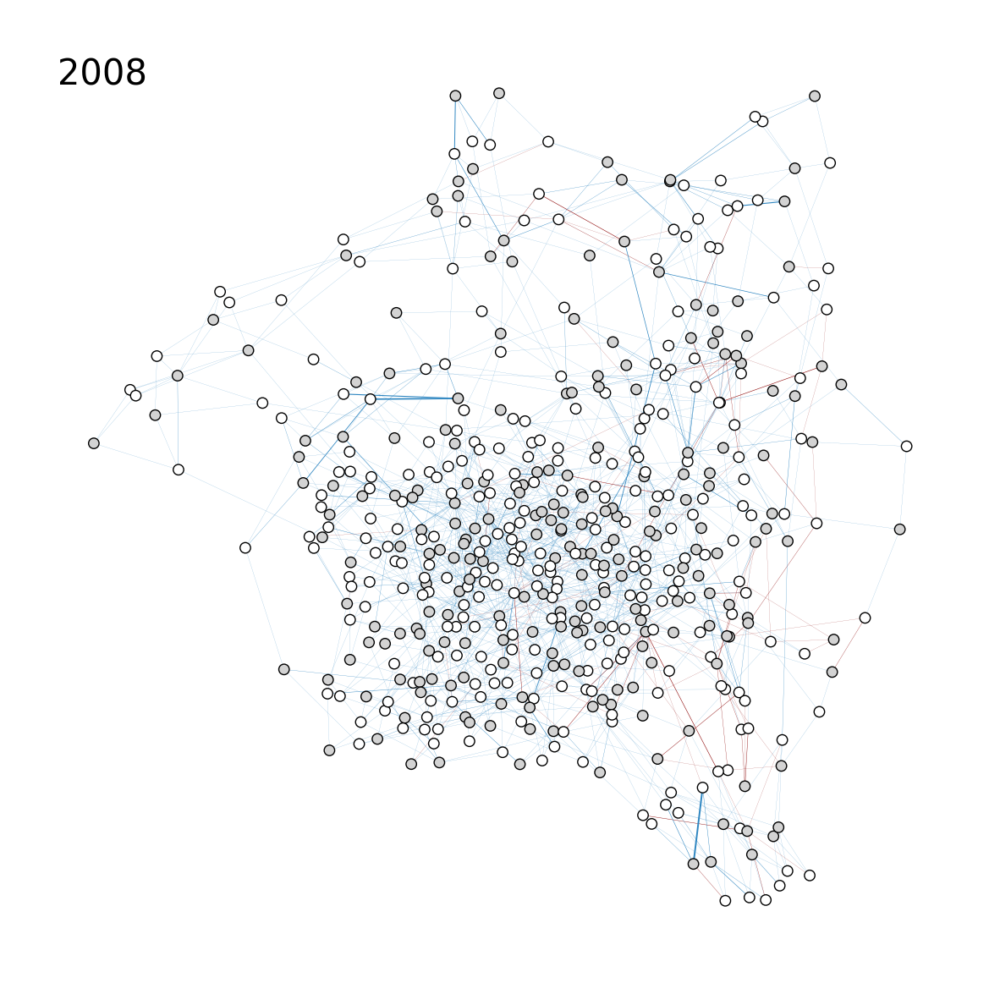

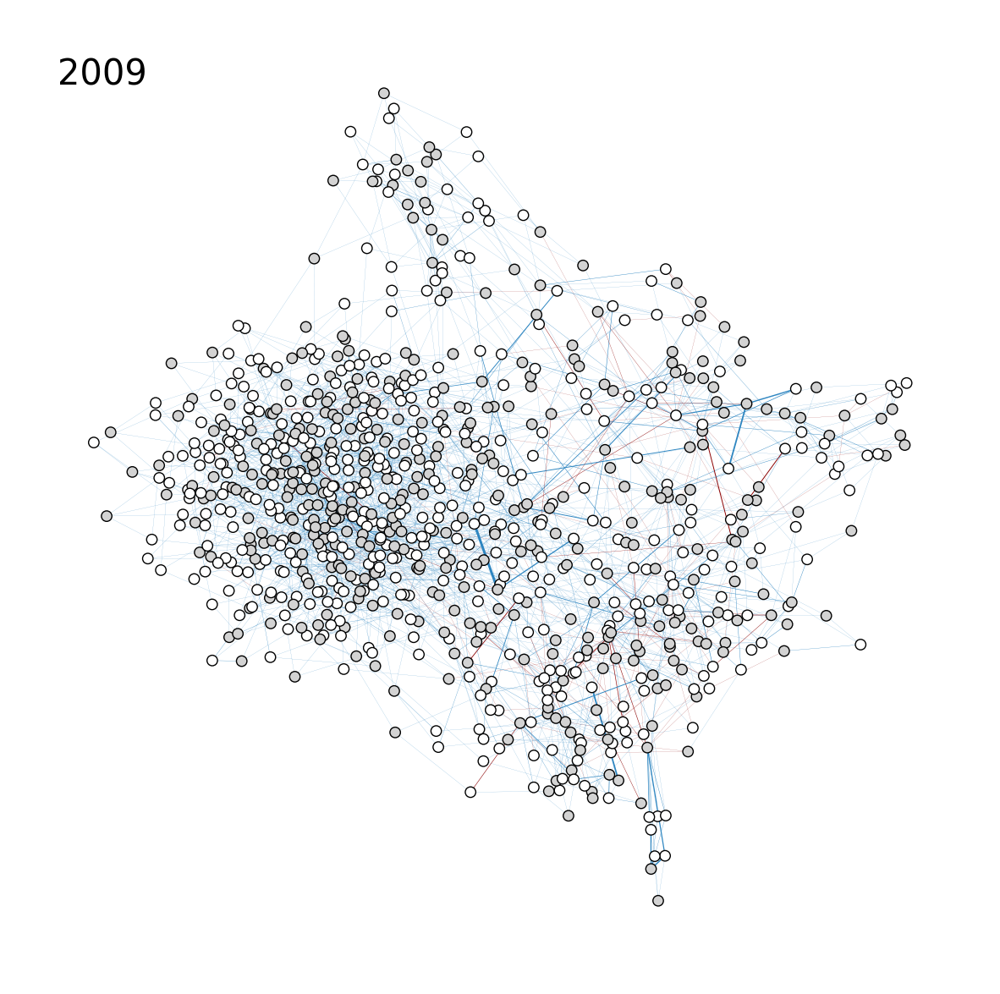

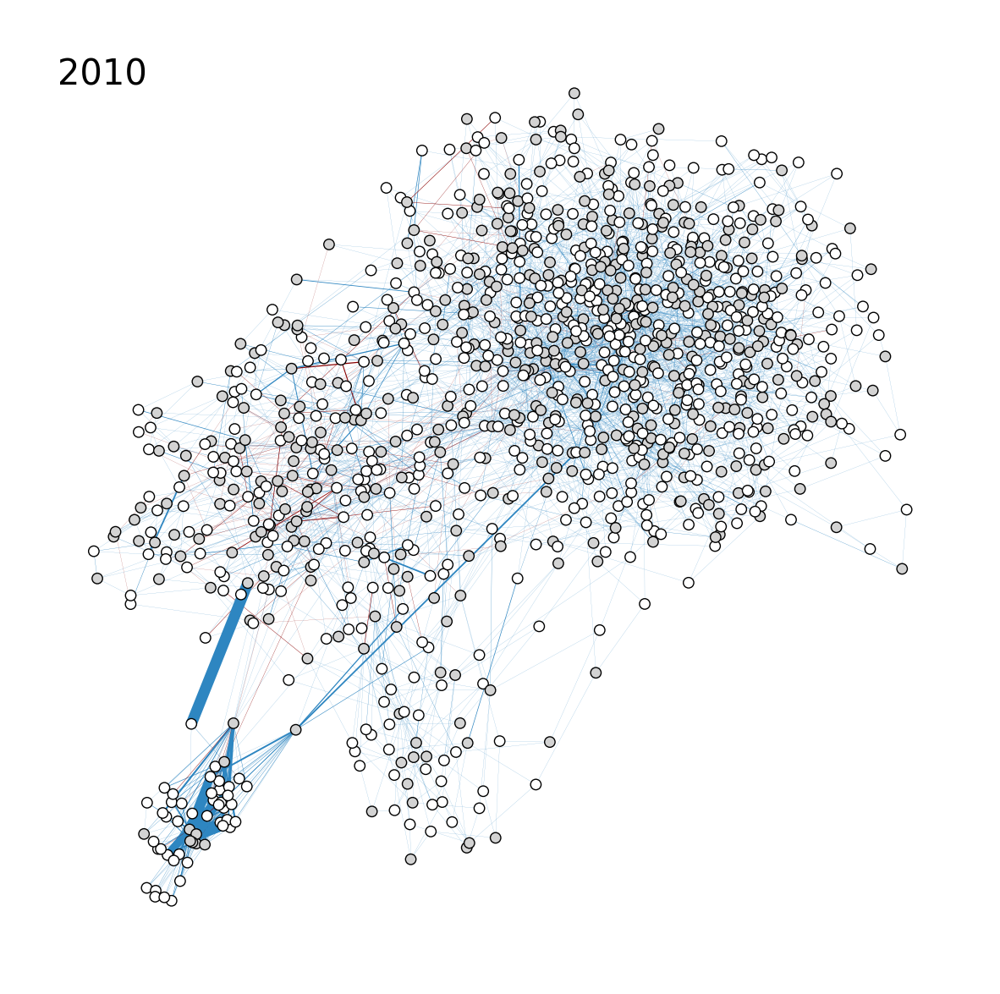

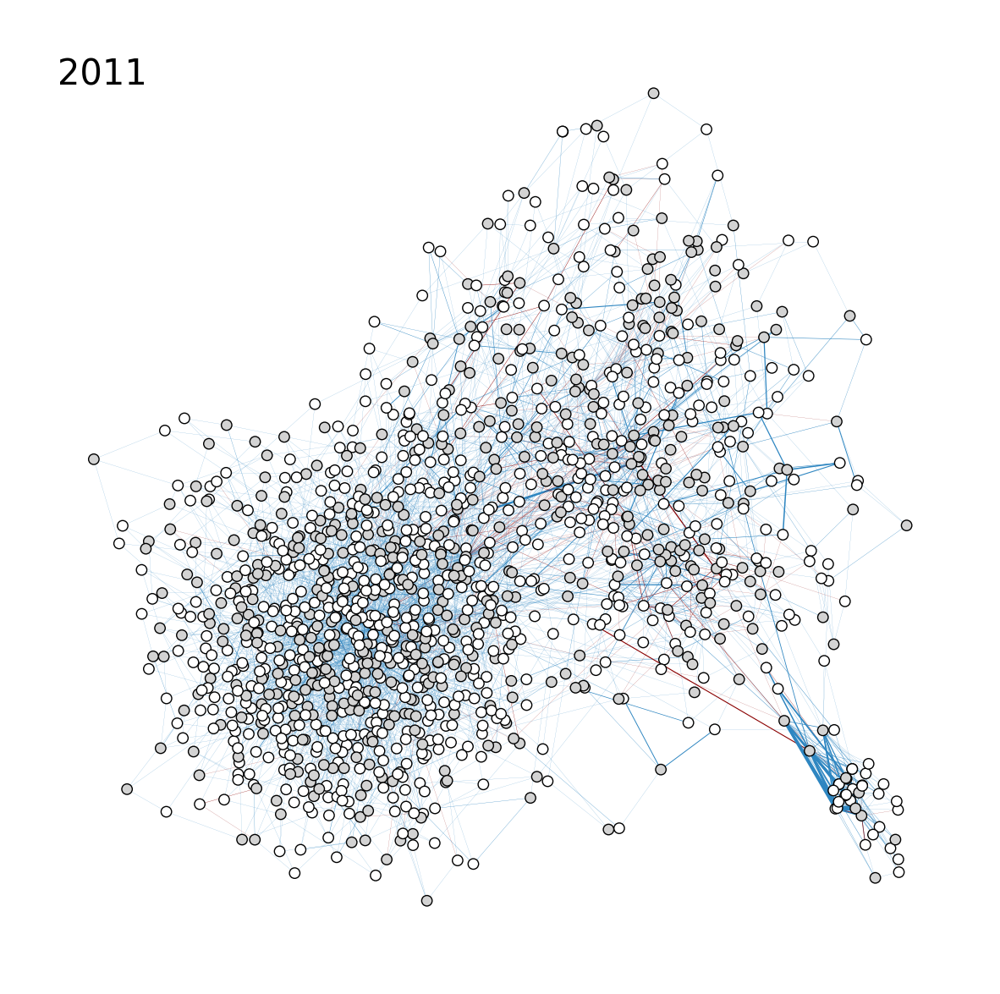

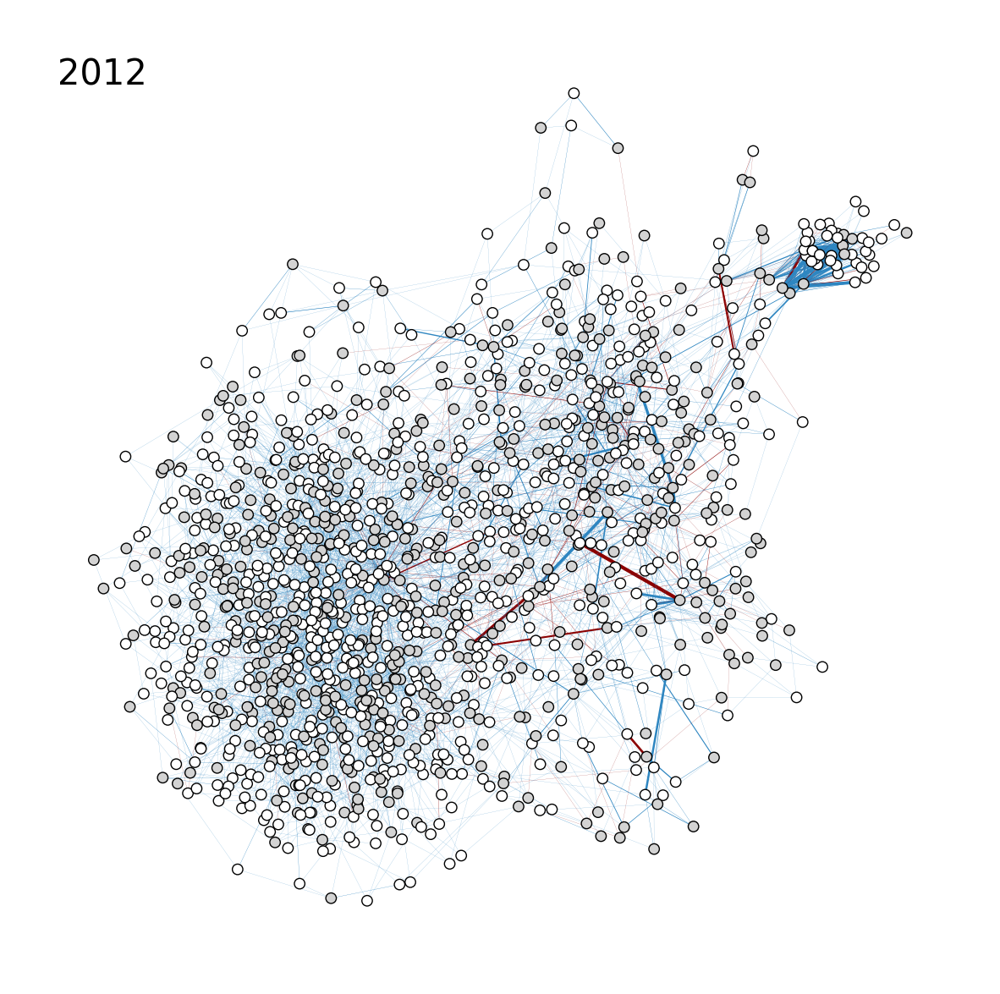

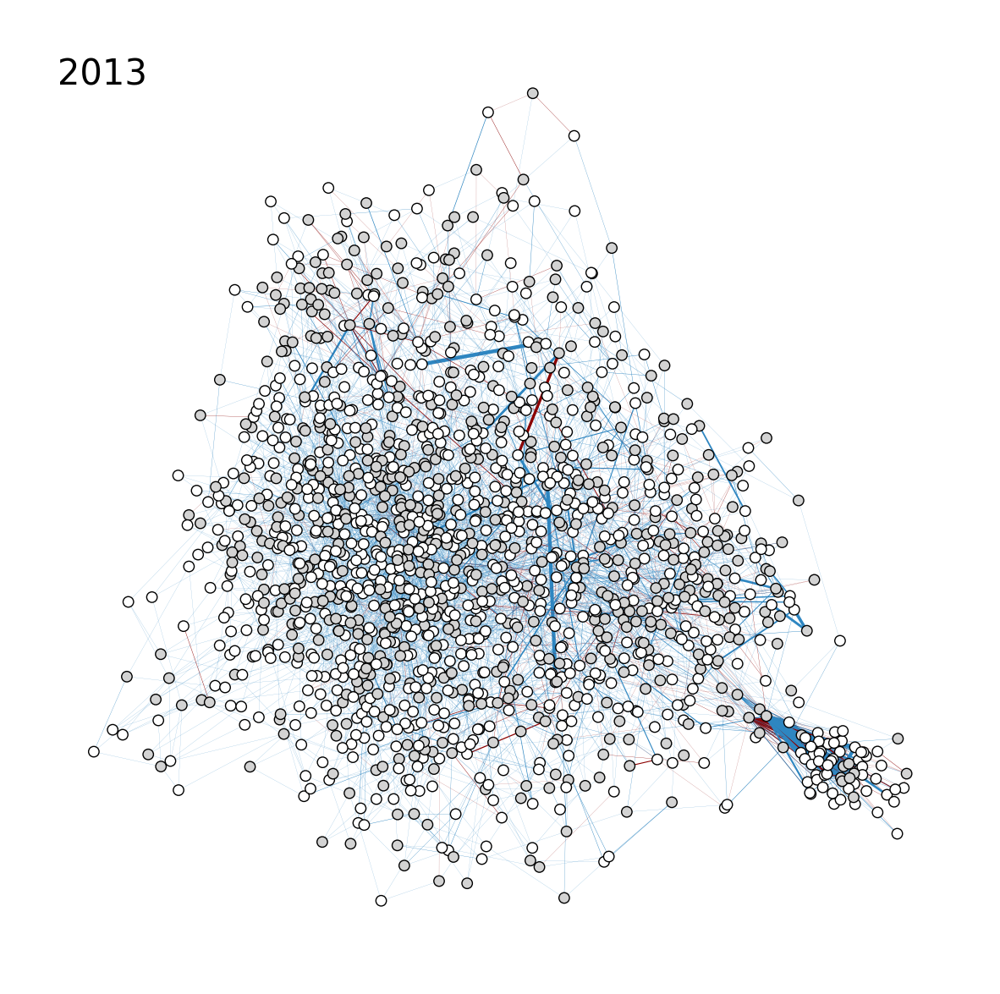

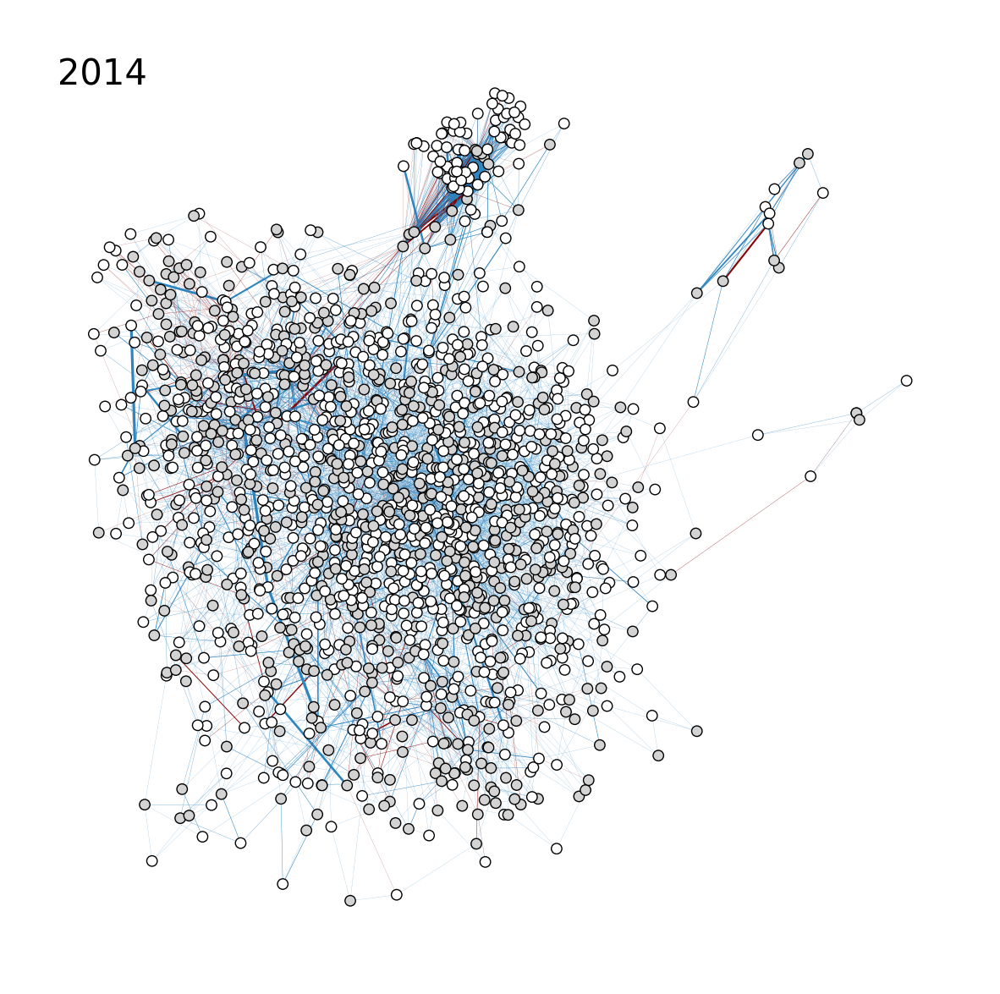

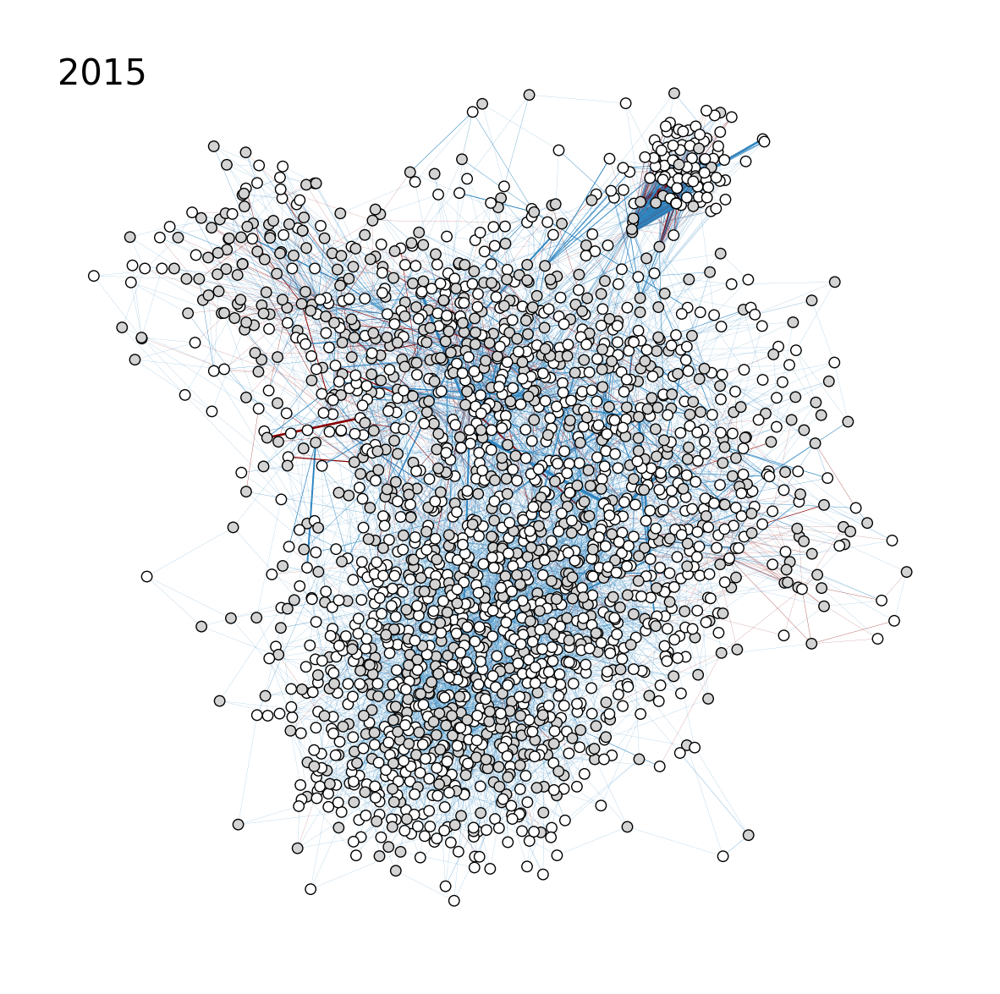

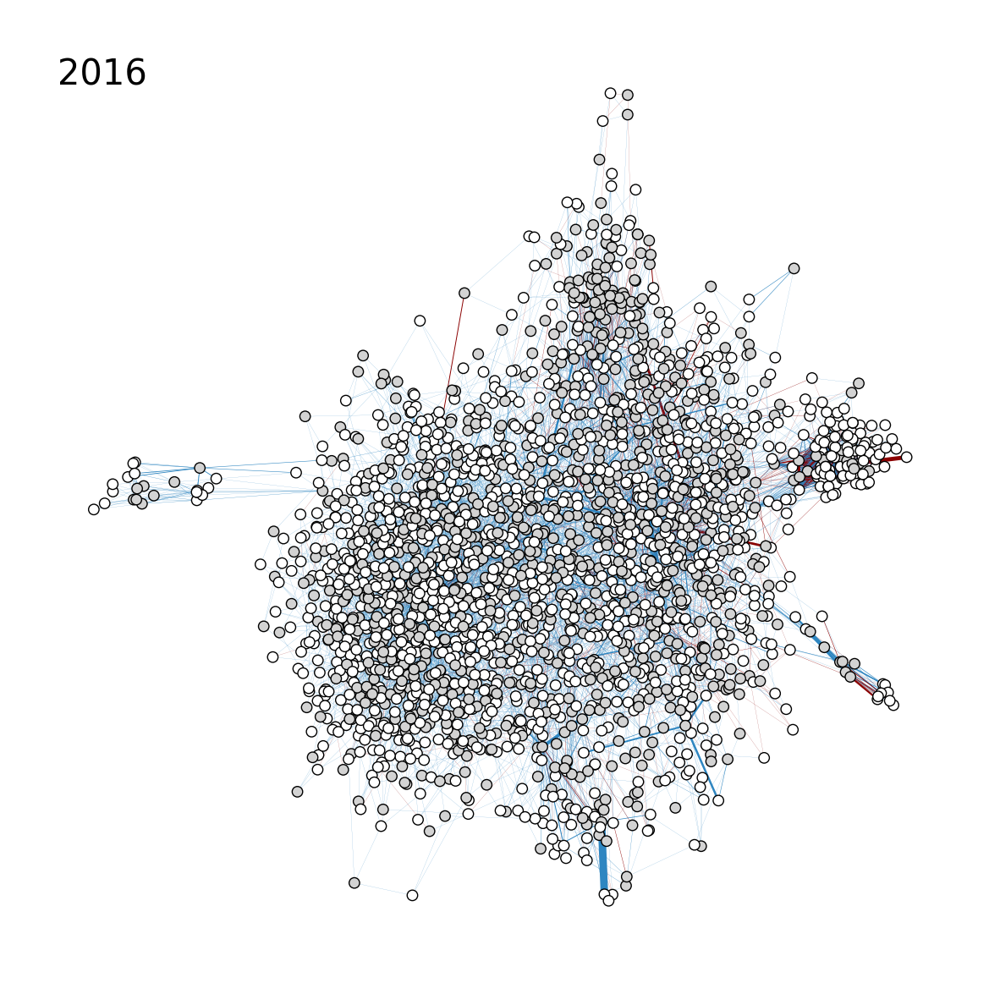

In [86]:
weight = 'count'
# plot k-shell
for year in range(2008, 2017):
    country = "DE"

    fig, ax = plt.subplots(figsize=(15,15))
    
    ax.text(0.05, 0.95, f"{year}", fontsize=30, transform=ax.transAxes, ha='left', va='top')

    seed=1
    random.seed(seed)

    # Nodes
    node_size = 80
    node_alpha=0.5
    node_colors = ['lightgray' if node.endswith('i') else 'white' if node.endswith('w') else 'blue' for node in globals()[f"{country}_{year}_k_core"].nodes()]

    # Edges
    # edge_alpha=0.7
    weights = nx.get_edge_attributes(globals()[f"{country}_{year}_k_core"], 'count')
    weights = {edge: weight * 0.1 for edge, weight in weights.items()}
    edge_colors = ['darkred' if globals()[f"{country}_{year}_k_core"].get_edge_data(*edge)['sbr_above_50']==1 else '#2e86c1' for edge in globals()[f"{country}_{year}_k_core"].edges()]
    edge_cmap = plt.cm.Blues

    # Plot the graph
    pos = nx.spring_layout(globals()[f"{country}_{year}_k_core"], seed=seed, scale=2)
    nx.draw(globals()[f"{country}_{year}_k_core"], pos, with_labels=False, edgecolors='black', node_size=node_size, node_color=node_colors, 
            edge_color=edge_colors, edge_cmap=edge_cmap, width=list(weights.values()))

    plt.savefig('../output/figures/k_shell' + str(country) + "_" + str(year) + '.png', bbox_inches='tight')
    plt.show()

In [87]:
# create dataframe of summary statistics
DE_core_summ = pd.DataFrame(columns = ['year', 'edges', 'nodes', 'winners', 'issuers', 'density', 'rac', 'wd_w', 'sd_w', 'wd_i', 'sd_i',
                                  'd_w', 'sd_ww', 'd_i', 'sd_ii'])

weight = 'count'
for year in range(2008, 2017):
  country = "DE"

  DE = globals()[f"{country}_{year}_k_core"]

  n_edges = DE.number_of_edges()

  n_nodes = DE.number_of_nodes()

  # n_nodes issuers
  issuer_nodes = [node for node in DE.nodes() if node.endswith('i')]
  issuer_subgraph = DE.subgraph(issuer_nodes)
  n_issuer_nodes = issuer_subgraph.number_of_nodes()

  # n_nodes winners
  winner_nodes = [node for node in DE.nodes() if node.endswith('w')]
  winner_subgraph = DE.subgraph(winner_nodes)
  n_winner_nodes = winner_subgraph.number_of_nodes()

  # degrees
  degrees = [deg for node, deg in DE.degree()]
  avg_degree = sum(degrees)/len(degrees)

  degrees_i = [deg for node, deg in DE.degree() if node.endswith('i')]
  avg_degree_i = sum(degrees_i)/len(degrees_i)
  std_dev_i = np.nanstd(degrees_i)

  degrees_w = [deg for node, deg in DE.degree() if node.endswith('w')]
  avg_degree_w = sum(degrees_w)/len(degrees_w)
  std_dev_w = np.nanstd(degrees_w)

  # weighted degrees
  wt_degrees = [deg for node, deg in DE.degree(weight=weight)]
  wt_avg_degree = np.nansum(wt_degrees)/len(wt_degrees)
  wt_std_dev = np.nanstd(wt_degrees)

  wt_degrees_i = [deg for node, deg in DE.degree(weight=weight) if node.endswith('i')]
  wt_avg_degree_i = np.nansum(wt_degrees_i)/len(wt_degrees_i)
  wt_std_dev_i = np.nanstd(wt_degrees_i)

  wt_degrees_w = [deg for node, deg in DE.degree(weight=weight) if node.endswith('w')]
  wt_avg_degree_w = np.nansum(wt_degrees_w)/len(wt_degrees_w)
  wt_std_dev_w = np.nanstd(wt_degrees_w)

  density = nx.density(DE)
  # bipartite.density(DE, issuer_nodes)

  rac = bipartite.robins_alexander_clustering(DE)

  row = pd.DataFrame({'year':year, 'edges':n_edges, 'nodes':n_nodes,
                      'winners':n_winner_nodes, 'issuers':n_issuer_nodes, 
                      'density':density, 'rac':rac,
                      'wd_w':wt_avg_degree_w, 'sd_w':wt_std_dev_w, 
                      'wd_i':wt_avg_degree_i, 'sd_i':wt_std_dev_i,
                      'd_w':avg_degree_w, 'sd_ww':std_dev_w, 
                      'd_i':avg_degree_i, 'sd_ii':std_dev_i,}, index=[0])
  
  DE_core_summ = pd.concat([DE_core_summ.loc[:], row]).reset_index(drop=True)

DE_core_summ

,year,edges,nodes,winners,issuers,density,rac,wd_w,sd_w,wd_i,sd_i,d_w,sd_ww,d_i,sd_ii
0,2008,1179,516,289,227,0.008873,0.074769,5.148789,3.719677,6.555066,4.727864,4.079585,2.331646,5.193833,3.324897
1,2009,2221,866,477,389,0.005930,0.051986,5.914046,4.613233,7.251928,6.225272,4.656184,3.000215,5.709512,3.897852
2,2010,3121,1127,661,466,0.004919,0.106997,7.762481,15.067057,11.010730,32.834967,4.721634,3.506376,6.697425,5.678500
3,2011,3717,1306,768,538,0.004362,0.063874,6.777344,8.166953,9.674721,14.280389,4.839844,3.717095,6.908922,6.446021
4,2012,3769,1326,778,548,0.004290,0.096273,7.482005,10.866108,10.622263,20.545250,4.844473,3.616618,6.877737,6.265828
5,2013,4339,1543,879,664,0.003647,0.111163,8.109215,12.912567,10.734940,24.069470,4.936291,3.706900,6.534639,6.601981
6,2014,4936,1650,965,685,0.003628,0.185618,9.323316,18.846122,13.134307,34.029477,5.115026,4.170241,7.205839,8.058180
7,2015,6612,2130,1256,874,0.002916,0.167056,8.400478,14.686413,12.072082,28.197661,5.264331,4.819368,7.565217,8.015630
8,2016,7144,2359,1355,1004,0.002569,0.167809,8.252399,13.811586,11.137450,23.798185,5.272325,5.021762,7.115538,7.593547


In [88]:
DE_core_summ.to_excel('../output/tables/DE_core_summary_stats_contracts.xlsx', index=True)

### Community detection

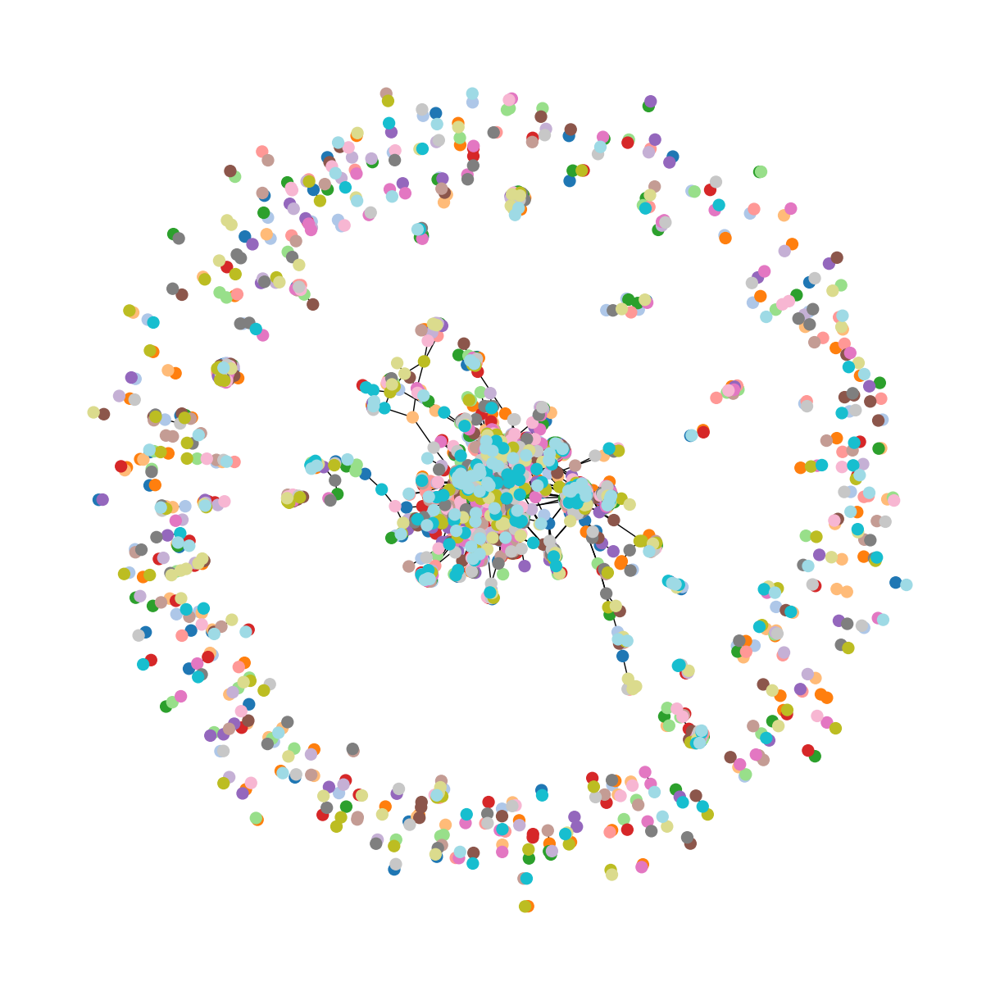

In [393]:
# G_sub_comm=nx.community.louvain_communities(G_sub, weight='n_bids', resolution=1, threshold=1e-07, seed=seed)

# # Create a dictionary to map nodes to their community index
# comm_dict = {}
# for i, comm in enumerate(G_sub_comm):
#     for node in comm:
#         comm_dict[node] = i

# node_size=100

# # Draw the graph with nodes colored by their community
# pos = nx.spring_layout(G_sub, seed=seed)
# plt.figure(figsize=(12, 12))
# nx.draw(G_sub, pos, node_size=node_size, node_color=[comm_dict[n] for n in G_sub.nodes()], cmap=plt.cm.tab20)
# plt.axis('off')
# plt.show()

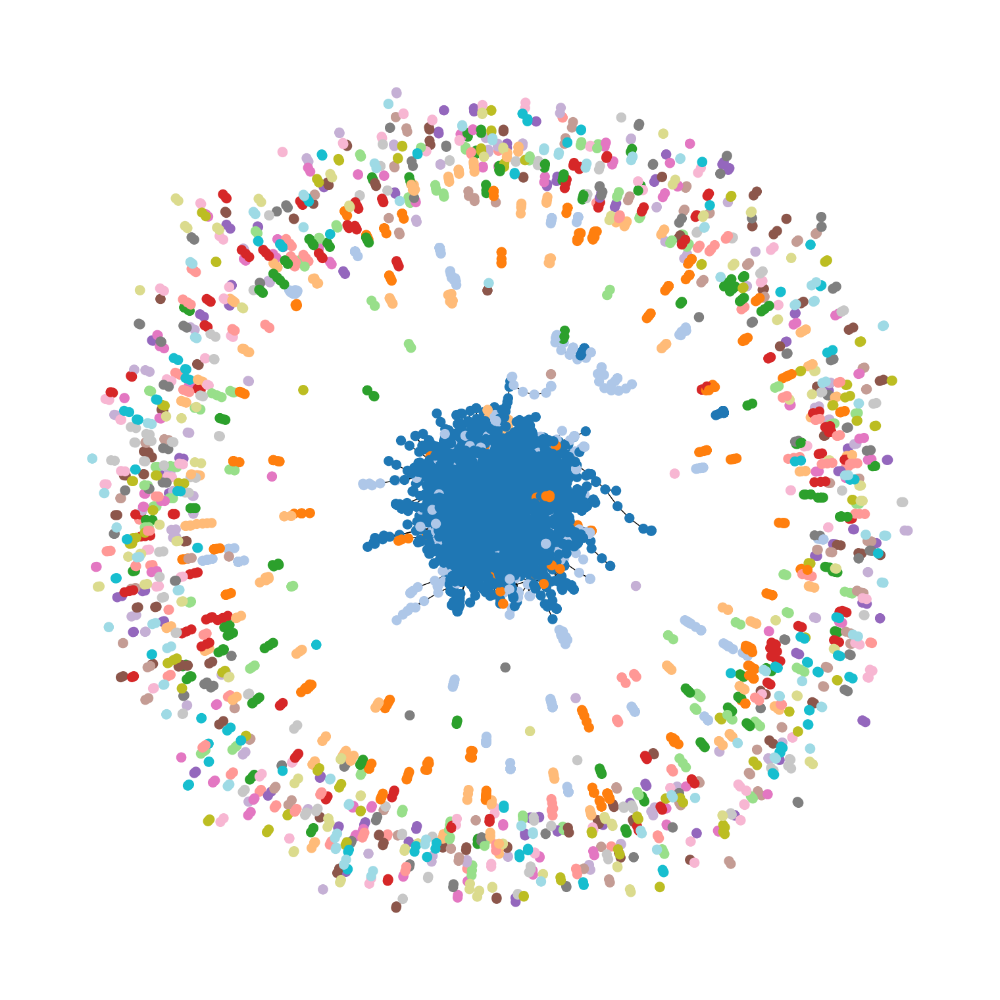

In [89]:
#  Compute the communities - greedy
G_sub_comm = nx.community.greedy_modularity_communities(DE_2016)

# Create a dictionary to map nodes to their community index
comm_dict = {}
for i, comm in enumerate(G_sub_comm):
    for node in comm:
        comm_dict[node] = i

node_size=100

# Draw the graph with nodes colored by their community
pos = nx.spring_layout(DE_2016, seed=seed)
plt.figure(figsize=(15, 15))
nx.draw(DE_2016, pos, node_size=node_size, node_color=[comm_dict[n] for n in DE_2016.nodes()], cmap=plt.cm.tab20)
plt.axis('off')
plt.show()

c:\Users\admin\anaconda3\envs\network_analysis\Lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


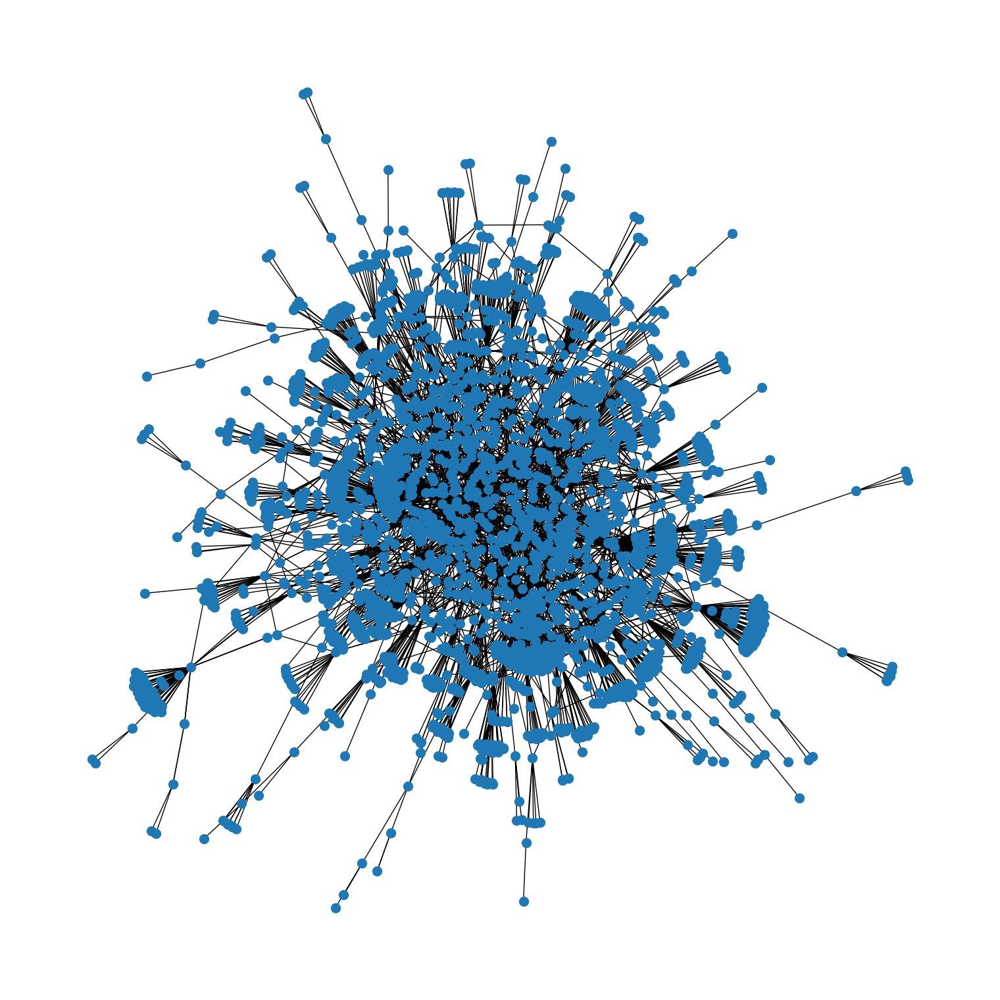

In [90]:
#  Largest component - greedy
G_sub_comm = nx.community.greedy_modularity_communities(DE_2016)

comm_dict = {}
for i, comm in enumerate(G_sub_comm):
    for node in comm:
        comm_dict[node] = i

subgraph_nodes = [node for node in DE_2016.nodes() if comm_dict[node] == 0]
G_sub = DE_2016.subgraph(subgraph_nodes)

pos = nx.spring_layout(G_sub, seed=seed)
plt.figure(figsize=(15, 15))
nx.draw(G_sub, pos, node_size=node_size, cmap=plt.cm.tab20)
plt.axis('off')
plt.show()


In [128]:
# Compute the modularity value of the community structure
modularity = nx.community.modularity(DE_2016, G_sub_comm)
print("Modularity value:", modularity)

Modularity value: 0.8503935189602704


## Descriptives - largest connected network

In [131]:
for year in range(2008, 2017):
    country = "DE"

    globals()[f"{country}_{year}_comm"] = nx.community.greedy_modularity_communities(globals()[f"{country}_{year}"])

    comm_dict = {}
    for i, comm in enumerate(globals()[f"{country}_{year}_comm"]):
        for node in comm:
            comm_dict[node] = i

    subgraphs = []
    for comm in globals()[f"{country}_{year}_comm"]:
        subgraph_nodes = [node for node in comm if comm_dict[node] == 0]
        subgraph = globals()[f"{country}_{year}"].subgraph(subgraph_nodes)
        subgraphs.append(subgraph)

    globals()[f"{country}_{year}_lcomm"] = subgraphs


In [146]:
# create dataframe of summary statistics
DE_centrality_summ = pd.DataFrame(columns = ['year', 'edges', 'nodes', 'winners', 'issuers', 'density', 'rac', 'wd_w', 'sd_w', 'wd_i', 'sd_i',
                                  'd_w', 'sd_ww', 'd_i', 'sd_ii', 'modularity',
                                  'degree_centrality', 'betweeness_centrality','closeness_centrality','pr_centrality'])

weight = 'count'
for year in range(2008, 2017):
  country = "DE"

  largest_comm = max(globals()[f"{country}_{year}_comm"], key=len)
  DE = globals()[f"{country}_{year}"].subgraph(largest_comm)

  mod = nx.community.modularity(globals()[f"{country}_{year}"], globals()[f"{country}_{year}_comm"])
  
  n_edges = DE.number_of_edges()

  n_nodes = DE.number_of_nodes()

  # n_nodes issuers
  issuer_nodes = [node for node in DE.nodes() if node.endswith('i')]
  issuer_subgraph = DE.subgraph(issuer_nodes)
  n_issuer_nodes = issuer_subgraph.number_of_nodes()

  # n_nodes winners
  winner_nodes = [node for node in DE.nodes() if node.endswith('w')]
  winner_subgraph = DE.subgraph(winner_nodes)
  n_winner_nodes = winner_subgraph.number_of_nodes()

  # degrees
  degrees = [deg for node, deg in DE.degree()]
  avg_degree = sum(degrees)/len(degrees)

  degrees_i = [deg for node, deg in DE.degree() if node.endswith('i')]
  avg_degree_i = sum(degrees_i)/len(degrees_i)
  std_dev_i = np.nanstd(degrees_i)

  degrees_w = [deg for node, deg in DE.degree() if node.endswith('w')]
  avg_degree_w = sum(degrees_w)/len(degrees_w)
  std_dev_w = np.nanstd(degrees_w)

  # weighted degrees
  wt_degrees = [deg for node, deg in DE.degree(weight=weight)]
  wt_avg_degree = np.nansum(wt_degrees)/len(wt_degrees)
  wt_std_dev = np.nanstd(wt_degrees)

  wt_degrees_i = [deg for node, deg in DE.degree(weight=weight) if node.endswith('i')]
  wt_avg_degree_i = np.nansum(wt_degrees_i)/len(wt_degrees_i)
  wt_std_dev_i = np.nanstd(wt_degrees_i)

  wt_degrees_w = [deg for node, deg in DE.degree(weight=weight) if node.endswith('w')]
  wt_avg_degree_w = np.nansum(wt_degrees_w)/len(wt_degrees_w)
  wt_std_dev_w = np.nanstd(wt_degrees_w)

  density = nx.density(DE)
  # bipartite.density(DE, issuer_nodes)

  rac = bipartite.robins_alexander_clustering(DE)

  # centrality measures
  degree_centrality = nx.degree_centrality(DE)
  betweenness_centrality = nx.betweenness_centrality(DE)
  closeness_centrality = nx.closeness_centrality(DE)
  pr_centrality = nx.pagerank(DE)

  sum_degree_centrality = sum(degree_centrality.values())
  avg_degree_centrality = sum_degree_centrality / len(degree_centrality)

  sum_betweeness_centrality = sum(betweenness_centrality.values())
  avg_betweeness_centrality = sum_betweeness_centrality / len(betweenness_centrality)

  sum_closeness_centrality = sum(closeness_centrality.values())
  avg_closeness_centrality = sum_closeness_centrality / len(closeness_centrality)

  sum_pr_centrality = sum(pr_centrality.values())
  avg_pr_centrality = sum_pr_centrality / len(pr_centrality)

  row = pd.DataFrame({'year':year, 'edges':n_edges, 'nodes':n_nodes,
                      'winners':n_winner_nodes, 'issuers':n_issuer_nodes, 
                      'density':density, 'rac':rac,
                      'wd_w':wt_avg_degree_w, 'sd_w':wt_std_dev_w, 
                      'wd_i':wt_avg_degree_i, 'sd_i':wt_std_dev_i,
                      'd_w':avg_degree_w, 'sd_ww':std_dev_w, 
                      'd_i':avg_degree_i, 'sd_ii':std_dev_i, 'modularity':mod,
                      'degree_centrality':avg_degree_centrality, 'betweeness_centrality':avg_betweeness_centrality,
                      'closeness_centrality':avg_closeness_centrality,'pr_centrality':avg_pr_centrality}, index=[0])
  
  DE_centrality_summ = pd.concat([DE_centrality_summ.loc[:], row]).reset_index(drop=True)

DE_centrality_summ

,year,edges,nodes,winners,issuers,density,rac,wd_w,sd_w,wd_i,sd_i,d_w,sd_ww,d_i,sd_ii,modularity,degree_centrality,betweeness_centrality,closeness_centrality,pr_centrality
0,2008,1776,1339,1199,140,0.001983,0.013046,1.886572,3.062400,16.157143,20.714823,1.481234,1.181356,12.685714,13.523570,0.901598,0.001983,0.003428,0.182092,0.000747
1,2009,1886,1394,1238,156,0.001942,0.012334,1.987076,3.065757,15.769231,24.562804,1.523425,1.224026,12.089744,16.367327,0.881172,0.001942,0.003171,0.188159,0.000717
2,2010,4406,2843,2541,302,0.001091,0.016957,2.329004,5.128071,19.596026,36.225413,1.733963,2.253176,14.589404,20.753767,0.876907,0.001091,0.001404,0.203066,0.000352
3,2011,3276,2188,1953,235,0.001369,0.019980,2.163850,4.063851,17.982979,25.954947,1.677419,1.932657,13.940426,17.081179,0.859078,0.001369,0.001848,0.201246,0.000457
4,2012,3855,2524,2258,266,0.001211,0.016007,2.297166,5.155921,19.500000,49.073541,1.707263,1.979020,14.492481,26.706599,0.858375,0.001211,0.001555,0.206600,0.000396
5,2013,1842,1297,1116,181,0.002192,0.024513,2.485663,7.174525,15.325967,24.917296,1.650538,1.894084,10.176796,9.407398,0.859602,0.002192,0.003810,0.171163,0.000771
6,2014,2503,1733,1531,202,0.001668,0.017010,2.460483,6.380098,18.648515,70.440764,1.634879,1.606018,12.391089,26.217493,0.855842,0.001668,0.002439,0.195944,0.000577
7,2015,6060,3647,3236,411,0.000911,0.020159,2.637824,8.756271,20.768856,48.224411,1.872682,2.670372,14.744526,20.054074,0.842951,0.000911,0.001113,0.200159,0.000274
8,2016,4002,2731,2440,291,0.001074,0.015435,2.377869,5.811577,19.938144,52.914146,1.640164,1.863593,13.752577,22.920165,0.850394,0.001074,0.001592,0.190101,0.000366


In [147]:
DE_centrality_summ.to_excel('../output/tables/DE_centrality_comm_summary.xlsx', index=True)

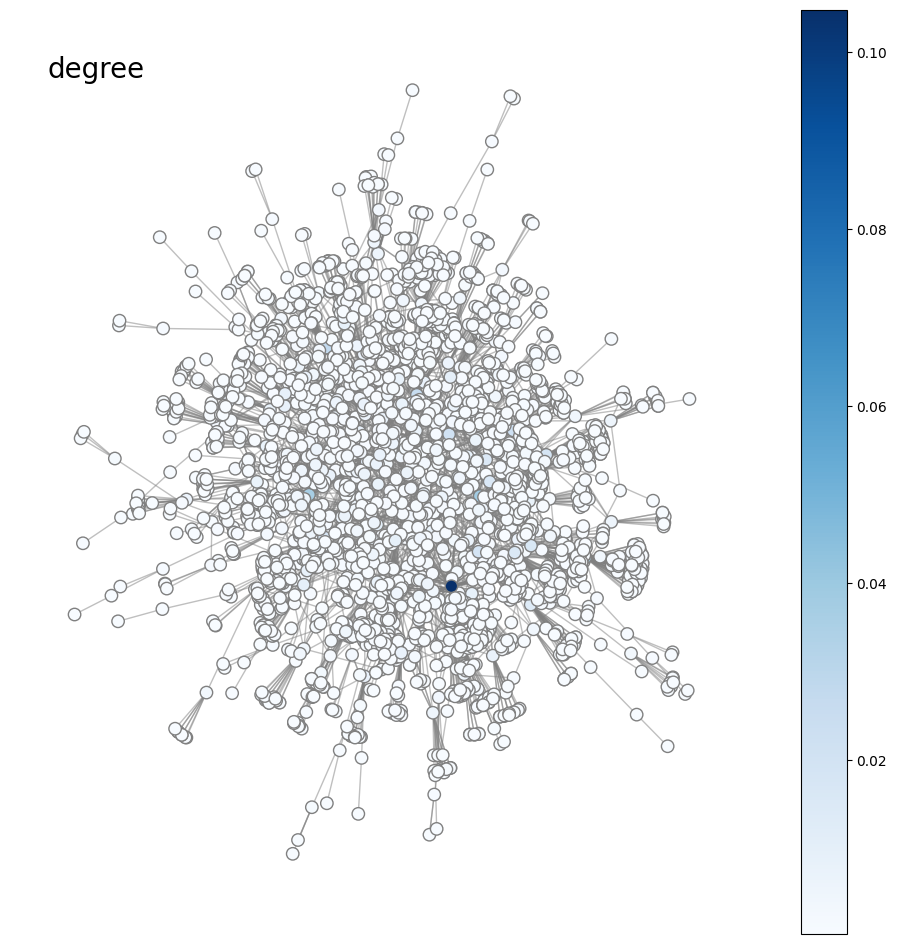

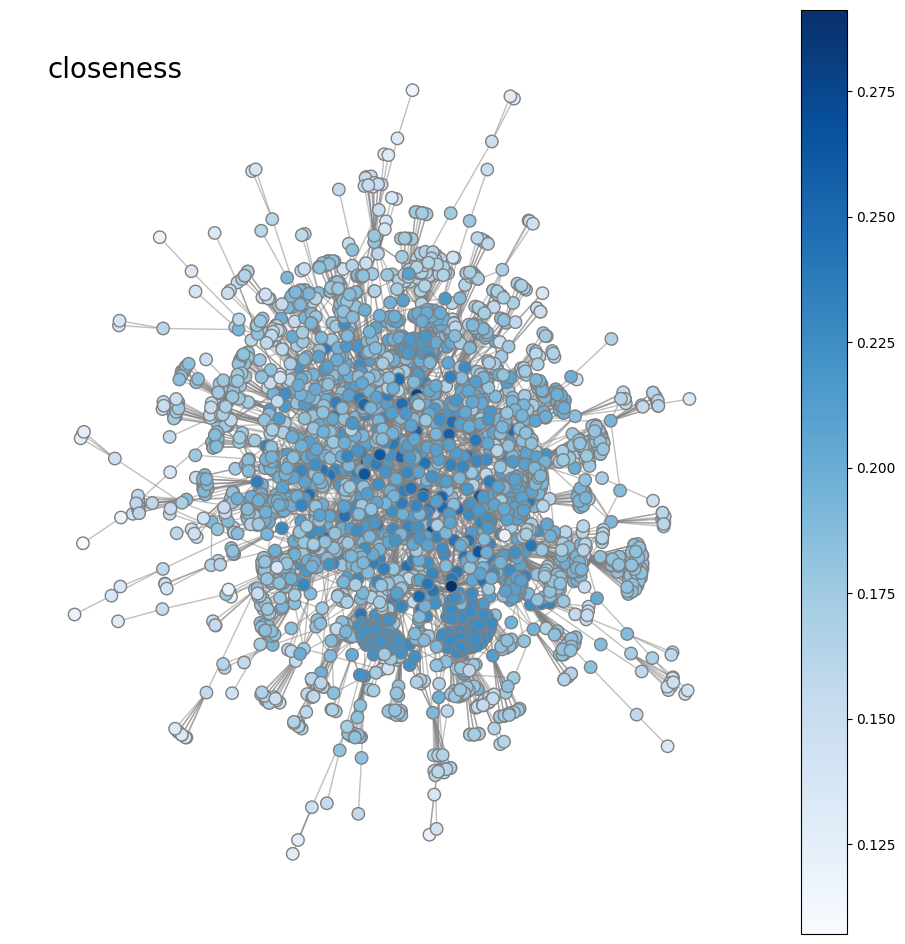

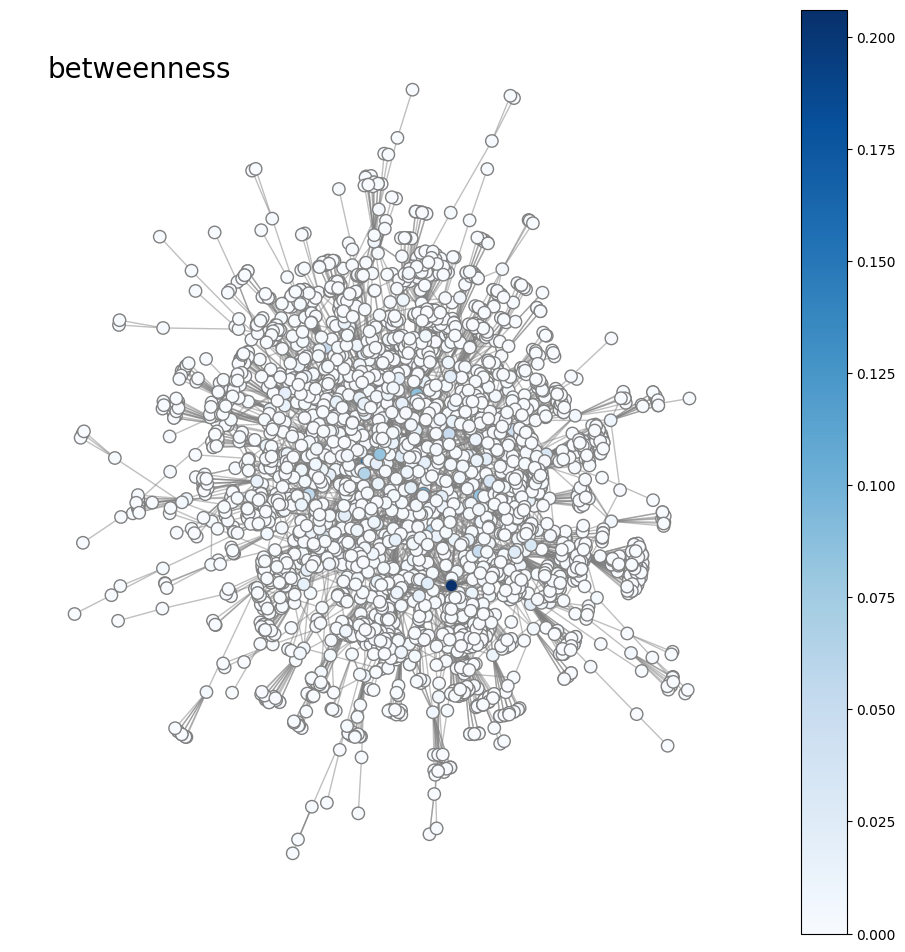

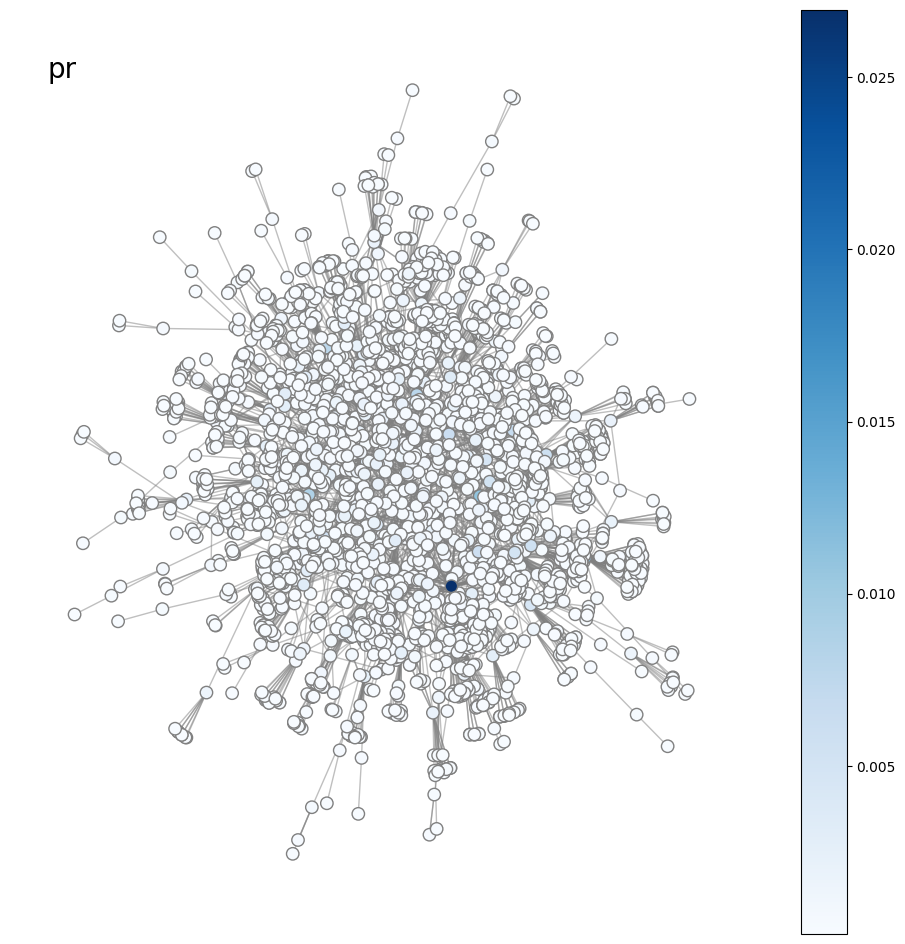

In [148]:
centrality_measures = ['degree', 'closeness', 'betweenness', 'pr']

for c in centrality_measures:
    random.seed(seed)
    pr = globals()[f"{c}_centrality"]

    # Draw the graph with nodes colored by PageRank centrality
    pos = nx.spring_layout(DE, seed=seed)
    fig, ax = plt.subplots(figsize=(12,12))

    # Add label to top left corner
    ax.text(0.05, 0.95, f"{c}", fontsize=20, transform=ax.transAxes, ha='left', va='top')

    nx.draw_networkx_edges(DE, pos, alpha=0.5, edge_color='gray')
    node_sm = nx.draw_networkx_nodes(DE, pos, node_color=list(pr.values()), cmap=plt.cm.Blues, node_size=80, edgecolors='gray')

    # Add colorbar to the plot
    plt.colorbar(node_sm, ax=plt.gca())
    plt.axis('off')

    plt.savefig('../output/figures/centrality_' + str(c) + "DE_2016" + '.png', bbox_inches='tight')

    plt.show()

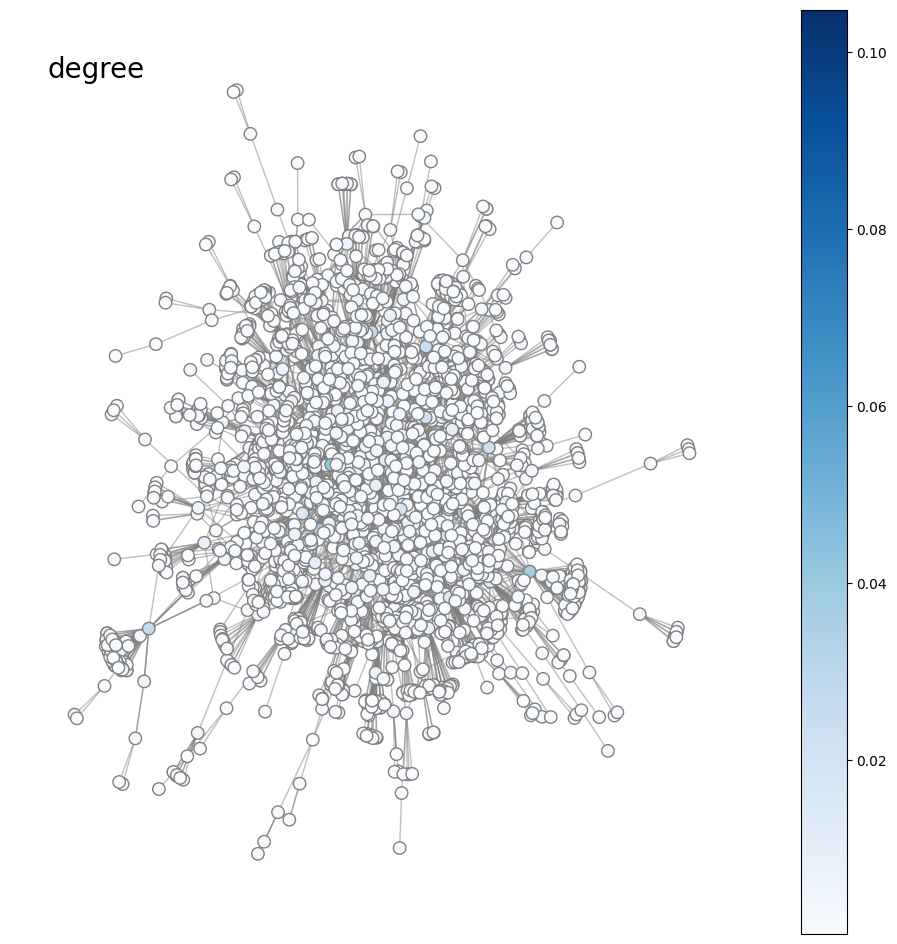

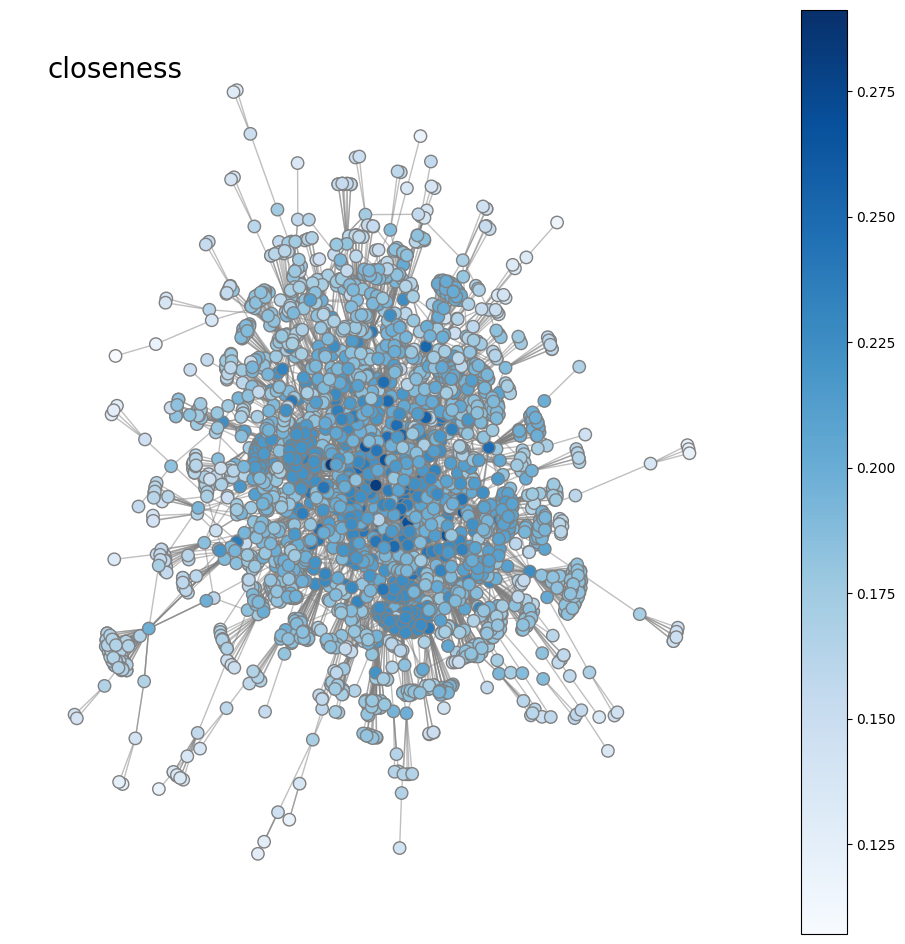

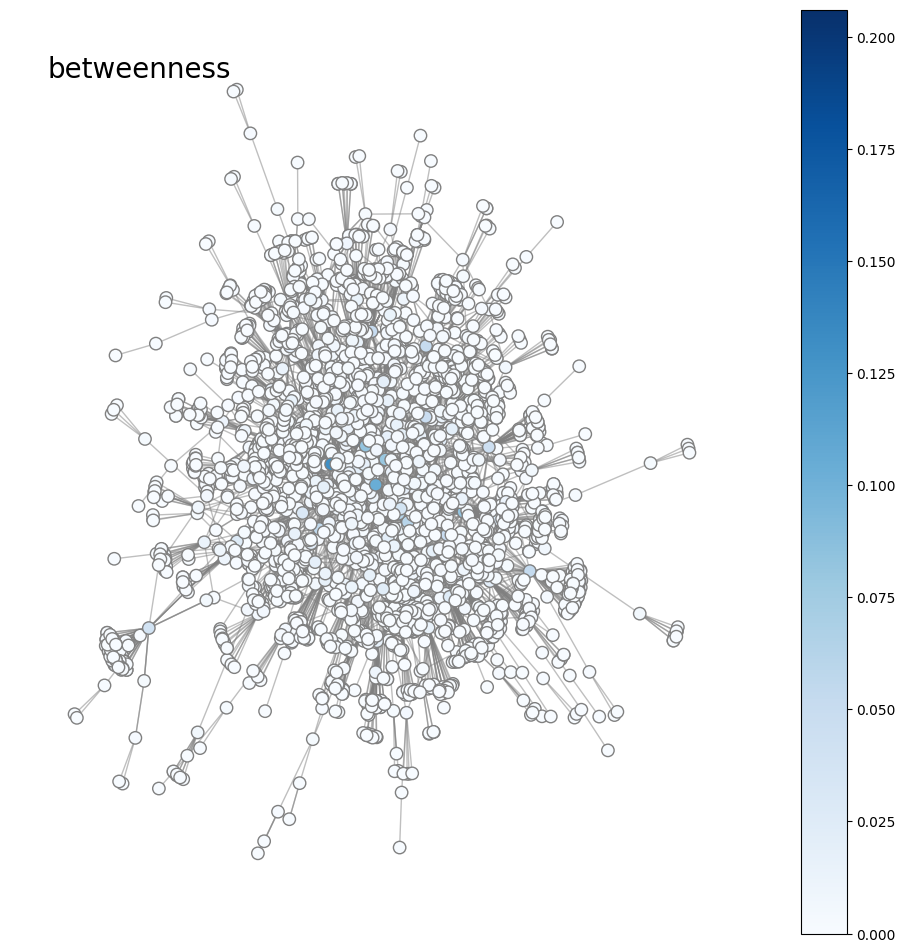

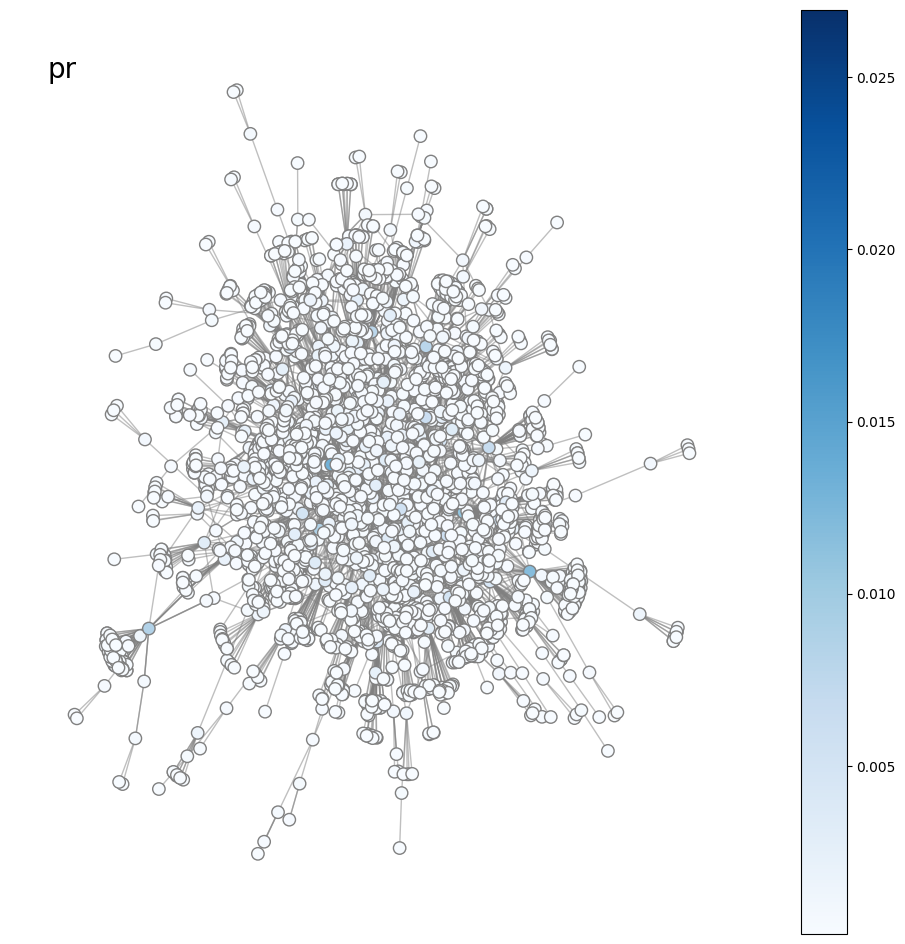

In [127]:
centrality_measures = ['degree', 'closeness', 'betweenness', 'pr']

for c in centrality_measures:
    random.seed(seed)
    pr = globals()[f"{c}_centrality"]

    # Draw the graph with nodes colored by PageRank centrality
    pos = nx.spring_layout(DE, seed=seed)
    fig, ax = plt.subplots(figsize=(12,12))

    # Add label to top left corner
    ax.text(0.05, 0.95, f"{c}", fontsize=20, transform=ax.transAxes, ha='left', va='top')

    nx.draw_networkx_edges(DE, pos, alpha=0.5, edge_color='gray')
    node_sm = nx.draw_networkx_nodes(DE, pos, node_color=list(pr.values()), cmap=plt.cm.Blues, node_size=80, edgecolors='gray')

    # Add colorbar to the plot
    plt.colorbar(node_sm, ax=plt.gca())
    plt.axis('off')

    plt.savefig('../output/figures/centrality_' + str(c) + "DE_2016" + '.png', bbox_inches='tight')

    plt.show()